In [1]:
from io import BytesIO

import requests
import pandas as pd
sheet_name = "Data AI4CKD" # replace with your own sheet name
sheet_id = '1a4iZPf93nLejpL7d7LYnF9JliV10etsJS8ia-bw1MXg' # replace with your sheet's ID
url = f"https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}"
from urllib.parse import quote

sheet_name = "Data AI4CKD"
encoded_sheet_name = quote(sheet_name)
url = f"https://docs.google.com/spreadsheets/d/1a4iZPf93nLejpL7d7LYnF9JliV10etsJS8ia-bw1MXg/gviz/tq?tqx=out:csv&sheet={encoded_sheet_name}"

print(url)  # This should be a properly encoded URL
df = pd.read_csv(url)
df.head()

https://docs.google.com/spreadsheets/d/1a4iZPf93nLejpL7d7LYnF9JliV10etsJS8ia-bw1MXg/gviz/tq?tqx=out:csv&sheet=Data%20AI4CKD


,ID,Sexe,Age,Nationalité,Profession (selon catégorie professionnelle),Adresse (Département),Situation Matrimoniale,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,...,Pathologies/Rétinopathie diabétique,Pathologies/Artériosclérose,Pathologies/Glaucome,Autres Pathologies,Rythme Cardiaque/Sinusal,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète
0,1.0,F,50,Béninoise,Artisan,Littoral,Marié(e),1,0,0,...,0,NaN,0,NaN,0,NaN,NaN,CKD 5,0,0
1,2.0,M,28,Béninoise,Artisan,Zou,Marié(e),1,1,0,...,0,NaN,0,NaN,0,NaN,NaN,CKD 5,0,0
2,3.0,F,69,Béninoise,NaN,Atlantique,Marié(e),1,1,0,...,0,NaN,0,NaN,0,NaN,NaN,CKD 5,0,0
3,4.0,M,68,Béninoise,Entrepreneur,Plateau,Marié(e),1,0,1,...,0,NaN,0,Flou visuel,0,NaN,Oui,CKD 5,0,0
4,5.0,F,68,Béninoise,NaN,NaN,Marié(e),1,1,0,...,0,NaN,1,NaN,0,Non,Non,CKD 5,1,0


In [2]:
# Suppression de la dernière ligne inutile
df = df.drop(df.index[-1])

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Columns: 201 entries, ID to Causes Majeure après Diagnostic/Diabète
dtypes: float64(1), object(200)
memory usage: 480.6+ KB


In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

def plot_categorical_histograms(df, categorical_vars):
    """
    Crée des histogrammes (countplots) pour plusieurs variables catégorielles sous forme de sous-plots.

    Args:
        df (pd.DataFrame): Le DataFrame contenant les données.
        categorical_vars (list): Liste des noms de colonnes catégorielles.

    Returns:
        None: Affiche directement les graphiques.
    """
    # Nombre total de variables
    num_vars = len(categorical_vars)

    # Déterminer le nombre de lignes et de colonnes pour les subplots
    cols = 2  # Fixer à 2 colonnes pour une meilleure lisibilité
    rows = math.ceil(num_vars / cols)  # Nombre de lignes nécessaire

    # Créer la figure et les axes
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
    axes = axes.flatten()  # Aplatir la grille d'axes en une liste

    # Parcourir chaque variable et tracer son countplot
    for i, var in enumerate(categorical_vars):
        sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
        axes[i].set_title(f"Distribution de {var}")
        axes[i].tick_params(axis='x', rotation=45)  # Rotation des labels pour lisibilité

    # Supprimer les axes inutilisés si le nombre de variables est impair
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# 🎯 Exemple d'utilisation :
# categorical_vars = ['BU/Leucocytose', 'BU/Nitrite', 'BU/Hématurie']
# plot_categorical_histograms_seaborn(df, categorical_vars)


In [5]:

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_histograms_by_stage(df, variables, categorie='Stage de l\'IRC'):
    """
    Génère des histogrammes pour une liste de variables catégorielles segmentées par une variable cible.

    Arguments :
        df : DataFrame contenant les données
        variables : Liste des variables catégorielles à afficher
        categorie : Variable de segmentation (ex. 'Stage IRC')
    """
    num_vars = len(variables)
    cols = 3  # Nombre max de colonnes
    rows = int(np.ceil(num_vars / cols))  # Nombre de lignes nécessaires

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
    axes = axes.flatten()  # Aplatir pour gérer facilement les indices

    for i, var in enumerate(variables):
        sns.histplot(data=df, x=var, hue=categorie, multiple="stack", ax=axes[i], shrink=0.8, palette="viridis")
        axes[i].set_title(f"Histogramme de {var} selon {categorie}")
        axes[i].set_xlabel(var)
        axes[i].set_ylabel("Nombre d'observations")

    # Supprime les axes inutilisés si le nombre de variables n'est pas un multiple de cols
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# # Exemple d'utilisation avec un DataFrame 'df'
# categorical_vars = [ 'Anémie', 'Cholestérol Total',
#        'Cholestérol HDL', 'Cholestérol LDL', 'Triglycérides', 'Grosseur Rein Gauche ', 'Grosseur Rein Droit ', 'Calcul Rénal',
#        'Kyste', 'Différenciation des reins', 'Echogénicité',
#        'Contour régulier/Rein droit', 'Contour régulier/Rein gauche',
#              'Rythme Cardiaque/Sinusal', 'Rythme Cardiaque/Régulier',
#        'Trouble de la Repolarisation',
# ]
# plot_histograms_by_stage(df, categorical_vars, 'Stage de l\'IRC')



In [6]:


def plot_numeric_boxplots(df, numeric_vars):
    """
    Crée des boxplots pour plusieurs variables numériques sous forme de sous-plots.

    Args:
        df (pd.DataFrame): Le DataFrame contenant les données.
        numeric_vars (list): Liste des noms de colonnes numériques.

    Returns:
        None: Affiche directement les graphiques.
    """
    # Nombre total de variables
    num_vars = len(numeric_vars)

    # Déterminer le nombre de lignes et de colonnes pour les subplots
    cols = 2  # Fixer à 2 colonnes pour une meilleure lisibilité
    rows = math.ceil(num_vars / cols)  # Nombre de lignes nécessaire

    # Créer la figure et les axes
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
    axes = axes.flatten()  # Aplatir la grille d'axes en une liste

    # Parcourir chaque variable et tracer son boxplot
    for i, var in enumerate(numeric_vars):
        sns.boxplot(data=df, y=var, ax=axes[i], palette="viridis")
        axes[i].set_title(f"Boxplot de {var}")

    # Supprimer les axes inutilisés si le nombre de variables est impair
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()



In [7]:

perso_columns=[ 'Nationalité', 'Profession (selon catégorie professionnelle)', 'Adresse (Département)', 'Situation Matrimoniale']


In [8]:
# plot_categorical_histograms(df, perso_columns)

In [9]:
#enlever person coloumns pour la suite
data =df.drop(columns=perso_columns+['ID'])
data.columns

Index(['Sexe', 'Age', 'Motif(s) d'Admission/Asthénie',
       'Motif(s) d'Admission/Altération de la fonction rénale',
       'Motif(s) d'Admission/HTA', 'Motif(s) d'Admission/Œdème',
       'Motif(s) d'Admission/Diabète',
       'Motif(s) d'Admission/Douleur abdominale', 'Autres Motifs d'Admission',
       'Personnels Médicaux/HTA',
       ...
       'Pathologies/Rétinopathie diabétique', 'Pathologies/Artériosclérose',
       'Pathologies/Glaucome', 'Autres Pathologies',
       'Rythme Cardiaque/Sinusal', 'Rythme Cardiaque/Régulier',
       'Trouble de la Repolarisation', 'Stage de l'IRC',
       'Causes Majeure après Diagnostic/HTA',
       'Causes Majeure après Diagnostic/Diabète'],
      dtype='object', length=196)

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Columns: 196 entries, Sexe to Causes Majeure après Diagnostic/Diabète
dtypes: object(196)
memory usage: 468.7+ KB


In [11]:
#columns of numerical types
numerical_data= [
       'Température (C°)', 'TA (mmHg)/Systole','TA (mmHg)/Diastole', 'Poul (bpm)', 'Poids (Kg)', 'Taille (m)',
       'SaO^2 (%)', 'FR (cpm)','Glycémie à jeun (taux de Glucose)', 'Urée (g/L)', 'Créatinine (mg/L)',  'Na^+ (meq/L)', 'K^+ (meq/L)', 'Ca^2+ (meq/L)', 'Cl^- (meq/L)',
       'P (meq/L)', 'Hb (g/dL)', 'Hématie (T/L)','Age',  'Hte (%)', 'VGM (fL)', 'TCMH (pg)', 'CCMH (%)' ,
       'NB (G/L)', 'PN (G/L)', 'PE (G/L)', 'PB (G/L)', 'Mo (G/L)', 'Ly (G/L)',
       'Ret (g/L)','Plaquettes (g/L)'

 ]
numerical_data =list(set(numerical_data))

In [12]:
#convert numerical_data in float type
for col in numerical_data:
    if data[col].dtype == 'object':
      print(col)
      data[col] = data[col].replace(',', '.', regex=True)
      data[col] = data[col].replace('%','').astype(float)

CCMH (%)
Poul (bpm)
PE (G/L)
Température (C°)
TA (mmHg)/Diastole
SaO^2 (%)
Mo (G/L)
Plaquettes (g/L)
Age
Créatinine (mg/L)
P (meq/L)
Hématie (T/L)
Hte (%)
NB (G/L)
Urée (g/L)
Ret (g/L)
Hb (g/dL)
FR (cpm)
K^+ (meq/L)
Ly (G/L)
TA (mmHg)/Systole
TCMH (pg)
Poids (Kg)
Ca^2+ (meq/L)
Cl^- (meq/L)
PB (G/L)
Na^+ (meq/L)
Taille (m)
VGM (fL)
PN (G/L)
Glycémie à jeun (taux de Glucose)


In [13]:
num= data[numerical_data]
#cat var are var excluded numerical ones
categorical_vars= data.drop(columns=numerical_data)

<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=var, ax=axes[i], palette="viridis")
<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=var, ax=axes[i], palette="viridis")
<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=var, ax=axes[i], palette="viridis")
<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable

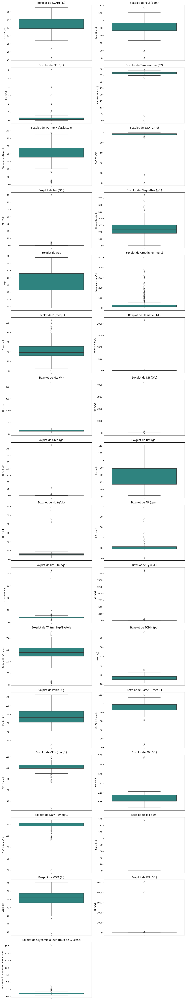

In [14]:
plot_numeric_boxplots(num, numerical_data)

<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` va

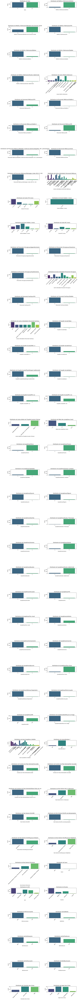

In [15]:
plot_categorical_histograms(categorical_vars, categorical_vars.columns[:len(categorical_vars.columns)//2])

<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` va

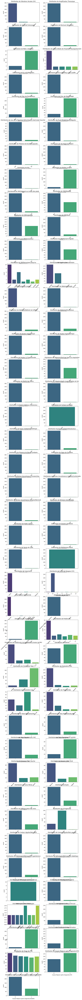

In [16]:
plot_categorical_histograms(categorical_vars, categorical_vars.columns[len(categorical_vars.columns)//2 :])

In [17]:
# Calculate percentage of missing values for each column.
missing_percentage = (df.isna().sum() / df.shape[0]) * 100

# Filter columns with more than 90% missing values.
columns_to_drop = missing_percentage[missing_percentage >= 90].index

# Display the columns to be dropped.
print("Columns with more than 90% missing values:")
print(columns_to_drop)

# Optionally, drop these columns from the DataFrame.
# df = df.drop(columns=columns_to_drop)

Columns with more than 90% missing values:
Index(['Autres Motifs d'Admission', 'Durée Diabète 1 (mois)',
       'Durée IRC (mois)', 'Autres Antécédents Personnels Familiaux',
       'Autres détails de l'Enquête Sociale à Préciser',
       'Etat Général (EG)/Autre', 'Râles crépitants',
       'Autres Détails de l'Examen Pleuropulmonaire', 'OMI/Remontant jusqu'au',
       'PB (G/L)', 'Ret (g/L)', 'Pathologies/Artériosclérose',
       'Autres Pathologies'],
      dtype='object')


In [18]:

to_drop = set(columns_to_drop)
to_drop.remove("Durée Diabète 1 (mois)")
to_drop.remove("Durée IRC (mois)")

In [19]:
to_drop

{'Autres Antécédents Personnels Familiaux',
 "Autres Détails de l'Examen Pleuropulmonaire",
 "Autres Motifs d'Admission",
 'Autres Pathologies',
 "Autres détails de l'Enquête Sociale à Préciser",
 'Etat Général (EG)/Autre',
 "OMI/Remontant jusqu'au",
 'PB (G/L)',
 'Pathologies/Artériosclérose',
 'Ret (g/L)',
 'Râles crépitants'}

In [20]:
droping=[]
for col in to_drop:
  if not col.startswith('Autres'):
    droping.append(col)


In [21]:
droping

['Ret (g/L)',
 'PB (G/L)',
 'Etat Général (EG)/Autre',
 "OMI/Remontant jusqu'au",
 'Râles crépitants',
 'Pathologies/Artériosclérose']

In [22]:

data = data.drop(columns=droping)

In [23]:
# Calculate percentage of missing values for each column.
missing_percentage = (data.isna().sum() / data.shape[0]) * 100

# Filter columns with more than 90% missing values.
columns_to_drop = missing_percentage[missing_percentage >= 80].index

# Display the columns to be dropped.
print("Columns with more than 90% missing values:")
print(columns_to_drop)

# Optionally, drop these columns from the DataFrame.
# df = df.drop(columns=columns_to_drop)

Columns with more than 90% missing values:
Index(['Autres Motifs d'Admission', 'Durée Diabète 1 (mois)',
       'Durée IRC (mois)', 'Autre Antécédent Personnel Chirurgical',
       'Autres Antécédents Personnels Familiaux',
       'Autres détails de l'Enquête Sociale à Préciser', 'SaO^2 (%)',
       'Coloration des Urines', 'Aspect des Urines',
       'Autres Détails de l'Examen Pleuropulmonaire', 'Protéinurie',
       'Hématie (T/L)', 'PE (G/L)', 'Tests Populaires/VIH',
       'Tests Populaires/Ag HBs', 'Tests Populaires/Ac HVC',
       'Autres Pathologies'],
      dtype='object')


In [24]:
to_drop= ['Tests Populaires/VIH',
       'Tests Populaires/Ag HBs', 'Tests Populaires/Ac HVC']
data = data.drop(columns=to_drop)

In [25]:
data[['Autre Antécédent Personnel Chirurgical', 'SaO^2 (%)',
       'Coloration des Urines', 'Aspect des Urines', 'Protéinurie',
       'Hématie (T/L)', 'PE (G/L)']].isna().sum()

,0
Autre Antécédent Personnel Chirurgical,273
SaO^2 (%),253
Coloration des Urines,259
Aspect des Urines,253
Protéinurie,245
Hématie (T/L),254
PE (G/L),246


In [26]:
# data= data.drop(columns=['Autre Antécédent Personnel Chirurgical', 'SaO^2 (%)',
#        'Coloration des Urines', 'Aspect des Urines', 'Protéinurie',
#        'Hématie (T/L)', 'PE (G/L)'])

<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")


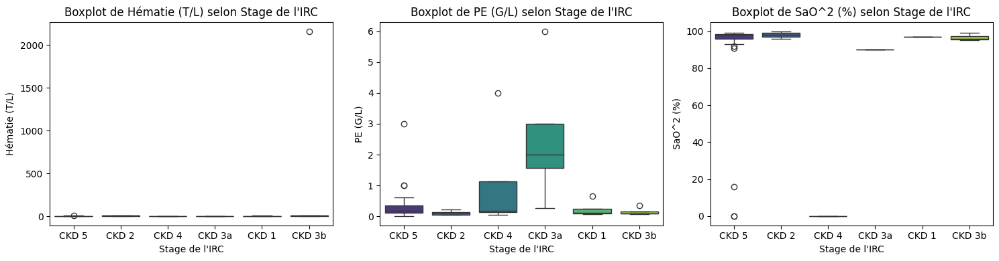

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_boxplots_by_stage(df, variables, categorie):
    """
    Génère des boxplots pour une liste de variables quantitatives par rapport à une variable catégorielle.

    Arguments :
        df : DataFrame contenant les données
        variables : Liste des variables quantitatives à afficher
        categorie : Nom de la variable catégorielle pour la segmentation (ex. stade de l'IRC)
    """
    num_vars = len(variables)
    cols = 3  # Nombre de colonnes max pour l'affichage
    rows = int(np.ceil(num_vars / cols))  # Nombre de lignes en fonction du nombre de variables

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
    axes = axes.flatten()  # Aplatir pour gérer facilement les indices

    for i, var in enumerate(variables):
        sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
        axes[i].set_title(f"Boxplot de {var} selon {categorie}")
        axes[i].set_xlabel(categorie)
        axes[i].set_ylabel(var)

    # Supprime les axes inutilisés si le nombre de variables n'est pas un multiple de cols
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Exemple d'utilisation avec un DataFrame 'df'
quantitative_vars = [ 'Hématie (T/L)', 'PE (G/L)','SaO^2 (%)'
]
plot_boxplots_by_stage(data, quantitative_vars, "Stage de l'IRC")


In [28]:

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_histograms_by_stage(df, variables, categorie):
    """
    Génère des histogrammes pour une liste de variables catégorielles segmentées par une variable cible.

    Arguments :
        df : DataFrame contenant les données
        variables : Liste des variables catégorielles à afficher
        categorie : Variable de segmentation (ex. 'Stage IRC')
    """
    num_vars = len(variables)
    cols = 3  # Nombre max de colonnes
    rows = int(np.ceil(num_vars / cols))  # Nombre de lignes nécessaires

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
    axes = axes.flatten()  # Aplatir pour gérer facilement les indices

    for i, var in enumerate(variables):
        sns.histplot(data=df, x=var, hue=categorie, multiple="stack", ax=axes[i], shrink=0.8, palette="viridis")
        axes[i].set_title(f"Histogramme de {var} selon {categorie}")
        axes[i].set_xlabel(var)
        axes[i].set_ylabel("Nombre d'observations")

    # Supprime les axes inutilisés si le nombre de variables n'est pas un multiple de cols
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Exemple d'utilisation avec un DataFrame 'df'

# plot_histograms_by_stage(df, categorical_vars, 'Stage de l\'IRC')



In [29]:
data.drop(columns=['Hématie (T/L)', 'PE (G/L)','SaO^2 (%)'],inplace=True)

In [30]:
# Calculate percentage of missing values for each column.
missing_percentage = (data.isna().sum() / data.shape[0]) * 100

# Filter columns with more than 90% missing values.
columns_to_drop = missing_percentage[missing_percentage >= 75].index

# Display the columns to be dropped.
print("Columns with more than 90% missing values:")
print(columns_to_drop)

# Optionally, drop these columns from the DataFrame.
# df = df.drop(columns=columns_to_drop)

Columns with more than 90% missing values:
Index(['Autres Motifs d'Admission', 'Durée Diabète 1 (mois)',
       'Durée IRC (mois)', 'Autre Antécédent Personnel Chirurgical',
       'Autres Antécédents Personnels Familiaux',
       'Autres détails de l'Enquête Sociale à Préciser',
       'Autre Symptôme à Notifier', 'FR (cpm)', 'Coloration des Urines',
       'Aspect des Urines', 'Autres Détails de l'Examen Pleuropulmonaire',
       'Protéinurie', 'Protéinurie à la bandellette urinaire (g/24h)',
       'Mo (G/L)', 'Autres Pathologies'],
      dtype='object')


In [31]:
data['Mo (G/L)'].isna().sum()

np.int64(235)

<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")


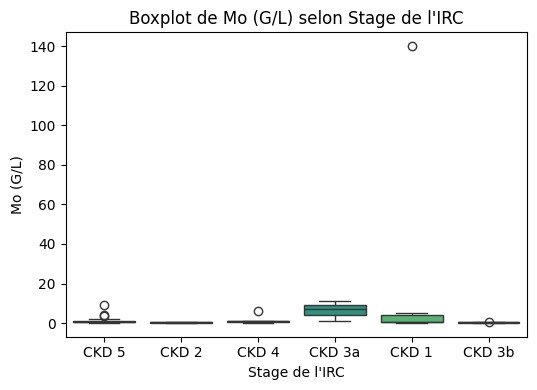

In [32]:
plot_boxplots_by_stage(data, ['Mo (G/L)'], "Stage de l'IRC")

In [33]:
data.drop(columns=['Mo (G/L)'],inplace=True)

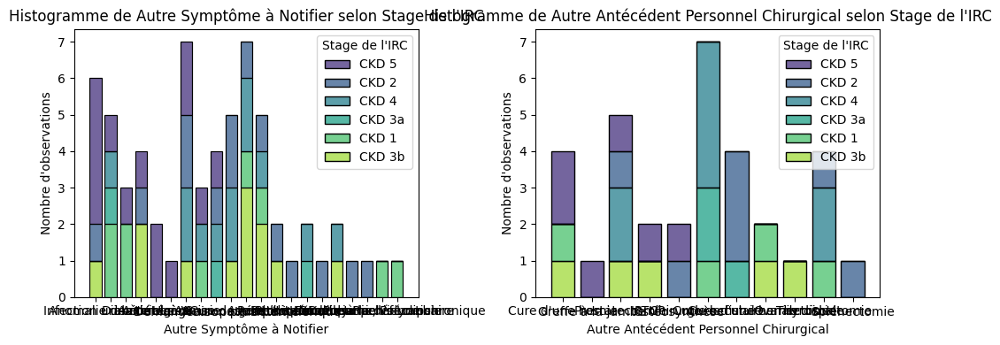

In [34]:
plot_histograms_by_stage(data, ['Autre Symptôme à Notifier','Autre Antécédent Personnel Chirurgical'], "Stage de l'IRC")

In [35]:
data['Autre Symptôme à Notifier'].unique()

array([nan, 'Infection urinaire', 'Anomalie des urines', 'Diabète',
       'Anxiété', 'Arthralgies', 'Ulcère', 'AVC', 'Anurie',
       'Démangeaison persistante', 'Crise de goutte', 'Ascite',
       'Neuropathie périphérique', 'Rhinite', 'Hoquet',
       'Perte de connaissance', 'Hématurie', 'Cardiopathie',
       'Rachis dorsal et Rachis Lombaire', 'Douleur à la défécation',
       'Polyurie, Polydipsie', 'Douleur pelvienne chronique'],
      dtype=object)

In [36]:
#fill na of 'Autre Antécédent Personnel Chirurgical' and "Autres Symptome"
data['Autre Antécédent Personnel Chirurgical'].fillna('Aucun', inplace=True)
data['Autre Symptôme à Notifier'].fillna('Aucun', inplace=True)

<ipython-input-36-19c291d2d509>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Autre Antécédent Personnel Chirurgical'].fillna('Aucun', inplace=True)
<ipython-input-36-19c291d2d509>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(val

In [37]:
others = [col for col in data.columns if 'Autre' in col]
#fillna
data=data.copy()
data[others] = data[others].fillna('Aucun')

In [38]:
data[others].isna().sum()

,0
Autres Motifs d'Admission,0
Autres Antécédents Personnels Médicaux,0
Autre Antécédent Personnel Chirurgical,0
Autres Antécédents Personnels Familiaux,0
Autres détails de l'Enquête Sociale à Préciser,0
Autre Symptôme à Notifier,0
Autres Détails de l'Examen Pleuropulmonaire,0
Autres Pathologies,0


<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")


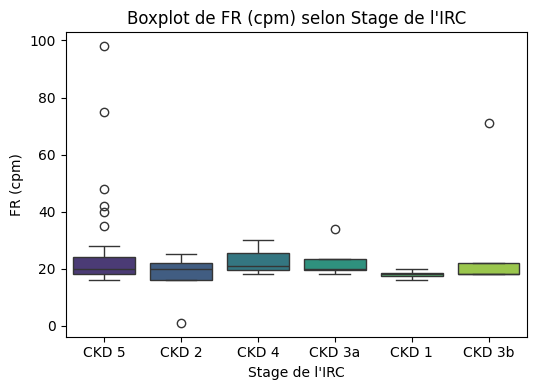

In [39]:
plot_boxplots_by_stage(data, ['FR (cpm)'], "Stage de l'IRC")

In [40]:
data['FR (cpm)'].describe()

,FR (cpm)
count,74.000000
mean,23.891892
std,13.691881
min,1.000000
25%,18.000000
50%,20.000000
75%,22.750000
max,98.000000


In [41]:
data.drop(columns=['FR (cpm)'],inplace=True)

In [42]:
df_temp=df.copy()
df= data.copy()
df_sadi=data.copy()

### ‘Durée Diabète 1 (mois), ‘Durée Diabète 2 (mois)’, 'Durée IRC (mois)' et ‘Durée HTA (mois)’

Ces variables sont des variables assez importantes compte tenu du contexte des données, mais elles présentent assez de valeurs manquantes.

#### ‘Durée Diabète 1 (mois)'

In [43]:
df_sadi['Durée Diabète 1 (mois)'].value_counts()

,count
Durée Diabète 1 (mois),
>=120,2


Il semble y avoir trop peu de données sur cette variable mais d'abord, voyons si d'autres relatives également au diabète peuvent nous aider à combler ce manque.

In [44]:
# Variables relatives au Diabète
diab = [col for col in df.columns if 'Diabète' in col]
diab

["Motif(s) d'Admission/Diabète",
 'Personnels Médicaux/Diabète 1',
 'Personnels Médicaux/Diabète 2',
 'Durée Diabète 1 (mois)',
 'Durée Diabète 2 (mois)',
 'Personnels Familiaux/Diabète',
 'Causes Majeure après Diagnostic/Diabète']

In [45]:
df[['Personnels Médicaux/Diabète 1', 'Durée Diabète 1 (mois)', 'Personnels Familiaux/Diabète', 'Causes Majeure après Diagnostic/Diabète']]

,Personnels Médicaux/Diabète 1,Durée Diabète 1 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
0,0,NaN,0,0
1,0,NaN,0,0
2,0,NaN,0,0
3,0,NaN,0,0
4,0,NaN,0,0
...,...,...,...,...
301,0,NaN,0,0
302,0,NaN,0,0
303,0,NaN,0,0
304,0,NaN,0,1


In [46]:
df.loc[~df['Durée Diabète 1 (mois)'].isna(), ['Personnels Médicaux/Diabète 1', 'Durée Diabète 1 (mois)', 'Personnels Familiaux/Diabète', 'Causes Majeure après Diagnostic/Diabète']]

,Personnels Médicaux/Diabète 1,Durée Diabète 1 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
77,1,>=120,0,1
215,1,>=120,0,1


Ainsi en considérant que la variable 'Personnels Médicaux/Diabète 1' indique la présence de diabète de type 1 ou non, alors on peut en déduire que lorque 'Personnels Médicaux/Diabète 1' == 0, 'Durée Diabète 1 (mois)' == 0 aussi !

In [47]:
df.loc[df['Personnels Médicaux/Diabète 1'] == '1', ['Personnels Médicaux/Diabète 1', 'Durée Diabète 1 (mois)', 'Personnels Familiaux/Diabète', 'Causes Majeure après Diagnostic/Diabète']]

,Personnels Médicaux/Diabète 1,Durée Diabète 1 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
54,1,NaN,0,1
55,1,NaN,0,1
77,1,>=120,0,1
215,1,>=120,0,1
216,1,NaN,0,0


In [48]:
df.loc[df['Personnels Médicaux/Diabète 1'] == '1', diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
54,0,1,0,NaN,NaN,0,1
55,0,1,1,NaN,>120,0,1
77,0,1,0,>=120,NaN,0,1
215,0,1,0,>=120,NaN,0,1
216,0,1,0,NaN,NaN,0,0


In [49]:
df.loc[(df['Personnels Médicaux/Diabète 1'] == '1') & (df['Causes Majeure après Diagnostic/Diabète'] == '0') & (df['Durée Diabète 1 (mois)'].isna()), diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
216,0,1,0,NaN,NaN,0,0


In [50]:
# Concernant les cas où 'Personnels Médicaux/Diabète 1' == 1, nous remplacerons les valeurs manquantes de 'Durée Diabète 1 (mois)' par le mode de cette variable pour les lignes dont les valeurs de 'Personnels Médicaux/Diabète 1' et 'Causes Majeure après Diagnostic/Diabète' sont les mêmes

subset = df[(df['Personnels Médicaux/Diabète 1'] == '1') & (df['Causes Majeure après Diagnostic/Diabète'] == '1') & (df['Durée Diabète 1 (mois)'].notna())]

mode = subset['Durée Diabète 1 (mois)'].mode()[0]

df.loc[(df['Personnels Médicaux/Diabète 1'] == '1') &
       (df['Causes Majeure après Diagnostic/Diabète'] == '1') &
       (df['Durée Diabète 1 (mois)'].isna()), 'Durée Diabète 1 (mois)'] = mode

df.loc[df['Personnels Médicaux/Diabète 1'] == '1', diab]


,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
54,0,1,0,>=120,NaN,0,1
55,0,1,1,>=120,>120,0,1
77,0,1,0,>=120,NaN,0,1
215,0,1,0,>=120,NaN,0,1
216,0,1,0,NaN,NaN,0,0


In [51]:
# Toutefois en considérant les données avant la précédente imputation, on constate qu'à la ligne 55, la cause majeure après diagnostic est le diabète, et le patient souffre justement du diabète 2 depuis plus de 120 mois, alors qu'on a pas la durée pendant laquelle il souffre du diabète 1 bien qu'il est indiqué qu'il en ait atteint.
# Il est donc fort probable que ce soit le diabète 2 qui soit à la base de sa maladie et que la durée du diabète 1 n'a pas été précisée car elle n'est pas la cause ici (ou n'est pas importante) ce qui pourrait amener à penser quecette durée n'est pas importante. Probablement moins de 6 mois. Suivant cette logique, nous allons donc rectifier la valeur de la variable à ce niveau.

df.loc[55, 'Durée Diabète 1 (mois)'] = '<6'

df.loc[df['Personnels Médicaux/Diabète 1'] == '1', diab]



,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
54,0,1,0,>=120,NaN,0,1
55,0,1,1,<6,>120,0,1
77,0,1,0,>=120,NaN,0,1
215,0,1,0,>=120,NaN,0,1
216,0,1,0,NaN,NaN,0,0


In [52]:
# Pour le cas unique où 'Personnels Médicaux/Diabète 1' == 1 et 'Causes Majeure après Diagnostic/Diabète' = 0, n'ayant pas d'autres observations similaires, on ne peut pas imputer par le mode.

# Mais en considérant le fait que s'il avait un diabète qui sévissait depuis longtemps, cela aurait affecté son rein et la cause du diagnostic aurait eu de grandes chances d'être le diabète comme tendent à le confirmer les autres observations, on peut supposer que le patient ne souffrait pas du diabète depuis longtemps. Donc une période < 6 mois par exemple. Nous allons donc remplacer la valeur manquante en suivant cette logique.

df.loc[(df['Personnels Médicaux/Diabète 1'] == '1') &
       (df['Causes Majeure après Diagnostic/Diabète'] == '0') &
       (df['Durée Diabète 1 (mois)'].isna()), 'Durée Diabète 1 (mois)'] = '<6'

df.loc[df['Personnels Médicaux/Diabète 1'] == '1', diab]


,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
54,0,1,0,>=120,NaN,0,1
55,0,1,1,<6,>120,0,1
77,0,1,0,>=120,NaN,0,1
215,0,1,0,>=120,NaN,0,1
216,0,1,0,<6,NaN,0,0


In [53]:
df.loc[(df['Durée Diabète 1 (mois)'].isna()) & (df['Personnels Médicaux/Diabète 1'] == '1'), diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète


In [54]:
# Maintenant on peut remplacer le reste des valeurs manquantes de 'Durée Diabète 1 (mois)' comme prévu

df.loc[df['Durée Diabète 1 (mois)'].isna(), 'Durée Diabète 1 (mois)'] = '0'

df[['Personnels Médicaux/Diabète 1', 'Durée Diabète 1 (mois)', 'Personnels Familiaux/Diabète', 'Causes Majeure après Diagnostic/Diabète']]

,Personnels Médicaux/Diabète 1,Durée Diabète 1 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
0,0,0,0,0
1,0,0,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0
...,...,...,...,...
301,0,0,0,0
302,0,0,0,0
303,0,0,0,0
304,0,0,0,1


In [55]:
df['Durée Diabète 1 (mois)'].value_counts()

,count
Durée Diabète 1 (mois),
0,301
>=120,3
<6,2


#### ‘Durée Diabète 2 (mois)'

In [56]:
df_sadi['Durée Diabète 2 (mois)'].value_counts()

,count
Durée Diabète 2 (mois),
>=120,30
>120,22
[60;120[,14
[12;60[,14
<6,2
[6;12[,2


In [57]:
df_sadi['Durée Diabète 2 (mois)'].isna().sum()

np.int64(222)

Voyons si d'autres relatives également au diabète peuvent nous aider à combler ce manque.

In [58]:
diab2 = ['Personnels Médicaux/Diabète 2', 'Durée Diabète 2 (mois)', 'Personnels Familiaux/Diabète', 'Causes Majeure après Diagnostic/Diabète']

df["Personnels Médicaux/Diabète 2"].value_counts()

,count
Personnels Médicaux/Diabète 2,
0,212
1,94


In [59]:
df.loc[(df['Personnels Médicaux/Diabète 2'] == '0') & (df['Durée Diabète 2 (mois)'].notna()), diab2]

,Personnels Médicaux/Diabète 2,Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète


In [60]:
df.loc[(df['Personnels Médicaux/Diabète 2'] == '1') & (df['Durée Diabète 2 (mois)'].isna()), diab2]

,Personnels Médicaux/Diabète 2,Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
7,1,NaN,0,0
9,1,NaN,0,0
70,1,NaN,0,0
74,1,NaN,0,1
81,1,NaN,0,1
168,1,NaN,0,1
222,1,NaN,0,1
245,1,NaN,0,1
256,1,NaN,0,1
296,1,NaN,0,1


In [61]:
df.loc[(df['Personnels Médicaux/Diabète 2'] == '1') & (df['Durée Diabète 2 (mois)'].notna()), diab2]

,Personnels Médicaux/Diabète 2,Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
2,1,[60;120[,0,0
5,1,>120,0,1
6,1,>=120,0,1
11,1,>=120,1,1
15,1,[60;120[,0,1
...,...,...,...,...
285,1,[60;120[,0,1
286,1,>=120,0,1
297,1,>120,0,1
299,1,>=120,0,1


Ainsi, la même hypothèse tend à se confirmer : la plupart des valeurs manquantes de 'Durée Diabète 2 (mois)' sont présentes lorsque 'Personnels Médicaux/Diabète 2' est à 0, tandis que lorsque cette dernière est à 1, la valeur de 'Durée Diabète 2 (mois)' n'est pas manquante la plupart du temps. Ce qui laisse entendre que ce manque de valeurs pourrait certainement corespondre à 0 mois de diabète de type 2.

Mais avant de traiter ces valeurs, traitons les quelques unes (10) qui sont présentes lorsque 'Personnels Médicaux/Diabète 2' est à 1.

In [62]:
df.loc[('Personnels Médicaux/Diabète 1' == '1') & (df['Personnels Médicaux/Diabète 2'] == '1'), diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète


In [63]:
df.loc[55, diab]

,55
Motif(s) d'Admission/Diabète,0
Personnels Médicaux/Diabète 1,1
Personnels Médicaux/Diabète 2,1
Durée Diabète 1 (mois),<6
Durée Diabète 2 (mois),>120
Personnels Familiaux/Diabète,0
Causes Majeure après Diagnostic/Diabète,1


In [64]:
# Concernant les cas où 'Personnels Médicaux/Diabète 2' == 1, nous remplacerons les valeurs manquantes de 'Durée Diabète 2 (mois)' par le mode de cette variable pour les lignes dont les valeurs de 'Personnels Médicaux/Diabète 2' et 'Causes Majeure après Diagnostic/Diabète' sont les mêmes

subset = df[(df['Personnels Médicaux/Diabète 2'] == '1') & (df['Causes Majeure après Diagnostic/Diabète'] == '1') & (df['Durée Diabète 2 (mois)'].notna())]

mode = subset['Durée Diabète 2 (mois)'].mode()[0]

df.loc[(df['Personnels Médicaux/Diabète 2'] == '1') &
       (df['Causes Majeure après Diagnostic/Diabète'] == '1') &
       (df['Durée Diabète 2 (mois)'].isna()), 'Durée Diabète 2 (mois)'] = mode

df.loc[(df['Personnels Médicaux/Diabète 2'] == '1') & (df['Durée Diabète 2 (mois)'].isna()), diab]


,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
7,0,0,1,0,NaN,0,0
9,0,0,1,0,NaN,0,0
70,0,0,1,0,NaN,0,0


In [65]:
subset = df[(df['Personnels Médicaux/Diabète 2'] == '1') & (df['Causes Majeure après Diagnostic/Diabète'] == '0') & (df['Durée Diabète 2 (mois)'].notna())]

mode = subset['Durée Diabète 2 (mois)'].mode()[0]

df.loc[(df['Personnels Médicaux/Diabète 2'] == '1') &
       (df['Causes Majeure après Diagnostic/Diabète'] == '0') &
       (df['Durée Diabète 2 (mois)'].isna()), 'Durée Diabète 2 (mois)'] = mode

df.loc[(df['Personnels Médicaux/Diabète 2'] == '1') & (df['Durée Diabète 2 (mois)'].isna()), diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète


In [66]:
df.loc[(df['Personnels Médicaux/Diabète 2'] == '0') & (df['Durée Diabète 2 (mois)'].notna()), diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète


In [67]:
df.loc[(df['Personnels Médicaux/Diabète 2'] == '0') & (df['Durée Diabète 2 (mois)'].isna()), diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
0,0,0,0,0,NaN,0,0
1,0,0,0,0,NaN,0,0
3,0,0,0,0,NaN,0,0
4,0,0,0,0,NaN,0,0
8,0,0,0,0,NaN,1,0
...,...,...,...,...,...,...,...
300,0,0,0,0,NaN,0,0
301,0,0,0,0,NaN,0,0
302,0,0,0,0,NaN,0,0
303,0,0,0,0,NaN,0,0


In [68]:
df.loc[(df['Personnels Médicaux/Diabète 2'] == '0') & (df['Durée Diabète 2 (mois)'].isna()), 'Durée Diabète 2 (mois)'] = '0'

df.loc[(df['Durée Diabète 2 (mois)'].isna()), diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète


In [69]:
df[diab]

,Motif(s) d'Admission/Diabète,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Durée Diabète 1 (mois),Durée Diabète 2 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète
0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,0,1,0,[60;120[,0,0
3,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...
301,0,0,0,0,0,0,0
302,0,0,0,0,0,0,0
303,0,0,0,0,0,0,0
304,1,0,1,0,>120,0,1


#### 'Durée HTA (mois)'

In [70]:
# Variables relatives au Diabète
hta = [col for col in df.columns if 'HTA' in col]
hta

["Motif(s) d'Admission/HTA",
 'Personnels Médicaux/HTA',
 'Durée HTA (mois)',
 'Personnels Familiaux/HTA',
 'Symptômes/HTA',
 'Causes Majeure après Diagnostic/HTA']

In [71]:
df_sadi['Durée HTA (mois)'].isna().sum()

np.int64(108)

In [72]:
df.loc[df['Durée HTA (mois)'].isna(), hta]

,Motif(s) d'Admission/HTA,Personnels Médicaux/HTA,Durée HTA (mois),Personnels Familiaux/HTA,Symptômes/HTA,Causes Majeure après Diagnostic/HTA
1,0,0,NaN,0,0,0
3,1,0,NaN,0,0,0
7,1,0,NaN,0,0,1
11,0,1,NaN,0,0,0
13,0,0,NaN,0,0,0
...,...,...,...,...,...,...
293,1,1,NaN,0,0,1
296,0,1,NaN,0,0,1
297,0,0,NaN,0,0,0
299,0,1,NaN,0,0,0


In [73]:
df.loc[(df['Personnels Médicaux/HTA']=='1'), hta]

,Motif(s) d'Admission/HTA,Personnels Médicaux/HTA,Durée HTA (mois),Personnels Familiaux/HTA,Symptômes/HTA,Causes Majeure après Diagnostic/HTA
0,0,1,>=120,0,0,0
2,0,1,>=120,0,0,0
4,0,1,>=120,0,1,1
5,0,1,[60;120[,0,0,0
6,0,1,[6;12[,0,0,0
...,...,...,...,...,...,...
301,0,1,[12;60[,0,0,1
302,0,1,[12;60[,0,0,1
303,0,1,[12;60[,0,1,1
304,0,1,>=120,0,0,1


In [74]:
df.loc[(df['Personnels Médicaux/Diabète 1'] == 1) & (df['Causes Majeure après Diagnostic/Diabète'] == 1) & (df['Durée Diabète 1 (mois)'].isna()), 'Durée Diabète 1 (mois)'] = mode

df.loc[df['Personnels Médicaux/Diabète 1'] == '1', ['Personnels Médicaux/Diabète 1', 'Durée Diabète 1 (mois)', 'Personnels Familiaux/Diabète', 'Causes Majeure après Diagnostic/Diabète', 'Personnels Médicaux/Diabète 2', 'Durée Diabète 2 (mois)']]

,Personnels Médicaux/Diabète 1,Durée Diabète 1 (mois),Personnels Familiaux/Diabète,Causes Majeure après Diagnostic/Diabète,Personnels Médicaux/Diabète 2,Durée Diabète 2 (mois)
54,1,>=120,0,1,0,0
55,1,<6,0,1,1,>120
77,1,>=120,0,1,0,0
215,1,>=120,0,1,0,0
216,1,<6,0,0,0,0


In [75]:
# df_sadi = df_sadi.drop(columns=['Durée Diabète 1 (mois)'])

In [76]:
durees=[col for col in df.columns if 'Durée' in col]
durees


['Durée HTA (mois)',
 'Durée Diabète 1 (mois)',
 'Durée Diabète 2 (mois)',
 'Durée IRC (mois)']

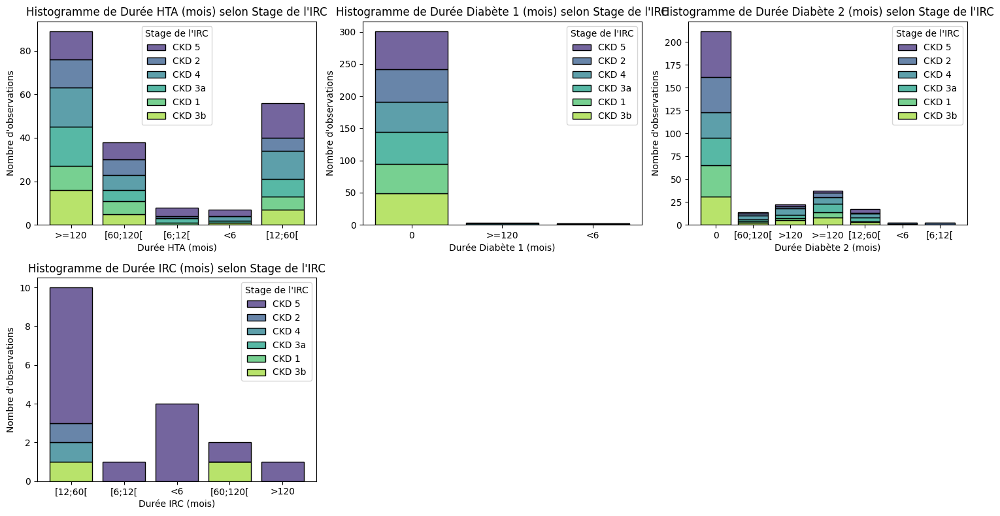

In [77]:
plot_histograms_by_stage(df, durees, "Stage de l'IRC")

In [78]:
import numpy as np
import pandas as pd
import scipy.stats as stats

def chi2_and_cramers_v(df, variables, variable_cible):

  chi2_results = []

  for var in variables:
      # Table de contingence
      contingency_table = pd.crosstab(df[var], df[variable_cible])

      # Test du chi-carré
      chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

      # Résultats
      chi2_results.append({
          'Variable': var,
          'Chi2': chi2,
          'P-value': p,
          'Degrés de liberté': dof,
          'Association significative': 'Oui' if p < 0.05 else 'Non'
      })

  # DataFrame résultant
  chi2_df = pd.DataFrame(chi2_results)

  # Calcul du V de Cramér pour chaque ligne du DataFrame existant
  cramers_v_list = []

  for index, row in chi2_df.iterrows():
      contingency_table = pd.crosstab(df[variables[index]], df[variable_cible])

      # Calcul du V de Cramér
      chi2 = row['Chi2']  # Récupère la statistique du test chi2 de la ligne
      n = contingency_table.sum().sum()  # Nombre total d'observations
      min_dim = min(contingency_table.shape) - 1  # Prendre la dimension minimale moins 1
      cramers_v = np.sqrt(chi2 / (n * min_dim))  # Calcul de V de Cramér

      # Ajouter le V de Cramér dans la liste
      cramers_v_list.append(cramers_v)

  # Ajouter la colonne 'V de Cramér' au DataFrame existant
  chi2_df['V de Cramér'] = cramers_v_list

  return chi2_df

target_var = 'Stage de l\'IRC'
df_khi=chi2_and_cramers_v(df, durees, target_var)
df_khi

,Variable,Chi2,P-value,Degrés de liberté,Association significative,V de Cramér
0,Durée HTA (mois),16.541141,0.682537,20,Non,0.144517
1,Durée Diabète 1 (mois),10.998735,0.357617,10,Non,0.134059
2,Durée Diabète 2 (mois),36.260474,0.199673,30,Non,0.153947
3,Durée IRC (mois),5.657143,0.932370,12,Non,0.323669


In [79]:
df[durees].isna().sum()

,0
Durée HTA (mois),108
Durée Diabète 1 (mois),0
Durée Diabète 2 (mois),0
Durée IRC (mois),288


In [80]:
df['Age'].isna().sum()

np.int64(7)

In [81]:
df['Age'] = df['Age'].iloc[:-1].dropna().astype(int)


In [82]:
#isna for numerical columns
df.select_dtypes(include=['float']).isna().sum()

,0
Age,8
Température (C°),173
TA (mmHg)/Systole,61
TA (mmHg)/Diastole,61
Poul (bpm),69
Poids (Kg),126
Taille (m),168
Glycémie à jeun (taux de Glucose),87
Urée (g/L),23
Créatinine (mg/L),0


In [83]:
df2 = df.copy()

In [84]:
df.drop(columns=['Poids (Kg)','Taille (m)','Hte (%)','VGM (fL)','TCMH (pg)','CCMH (%)','NB (G/L)','PN (G/L)','Ly (G/L)','Plaquettes (g/L)','Température (C°)'],inplace=True)

In [85]:
len(df.columns)

171

In [86]:
#isna for numerical columns
df.select_dtypes(include=['float']).isna().sum()

,0
Age,8
TA (mmHg)/Systole,61
TA (mmHg)/Diastole,61
Poul (bpm),69
Glycémie à jeun (taux de Glucose),87
Urée (g/L),23
Créatinine (mg/L),0
Na^+ (meq/L),35
K^+ (meq/L),30
Ca^2+ (meq/L),91


In [87]:
df.drop(columns=['P (meq/L)'],inplace=True)

In [88]:
others = [col for col in df.columns if 'Autre' in col]
#fillna

df[others] = df[others].fillna('Aucun')

In [89]:
#isna for numerical columns
objects =df.select_dtypes(include=['object']).columns[df.select_dtypes(include=['object']).isna().sum() !=0]
df[objects].isna().sum()

,0
Sexe,8
Durée HTA (mois),108
Durée IRC (mois),288
Début des symptômes (mois),130
Etat Général (EG) à l'Admission,5
IMC,169
BU/Leucocytose,225
BU/Nitrite,225
BU/Hématurie,225
BU/Protéinurie,225


In [90]:
df.drop(columns=['Durée HTA (mois)','Tests Populaires/PU (g/24h)','Durée IRC (mois)',"Contour régulier/Rein droit","Contour régulier/Rein gauche"],inplace=True)

In [91]:
df['Début des symptômes (mois)'].value_counts()

,count
Début des symptômes (mois),
<=1,103
>3,56
]1;3],17


In [92]:
df.drop(columns=['Lieu de la Palpation/ EICG (Espace InterCostal Gauche)  '],inplace=True)

In [93]:
#isna for numerical columns
objects =df.select_dtypes(include=['object']).columns[df.select_dtypes(include=['object']).isna().sum() !=0]
df[objects].isna().sum()

,0
Sexe,8
Début des symptômes (mois),130
Etat Général (EG) à l'Admission,5
IMC,169
BU/Leucocytose,225
BU/Nitrite,225
BU/Hématurie,225
BU/Protéinurie,225
BU/Glucosurie,225
BU/Albuminuerie,225


In [94]:
len(df.columns)

164

In [95]:
df['Score de Glasgow (/15)'].value_counts()

,count
Score de Glasgow (/15),
15,266
14,3
13,2
8,1
9,1
11,1
12,1


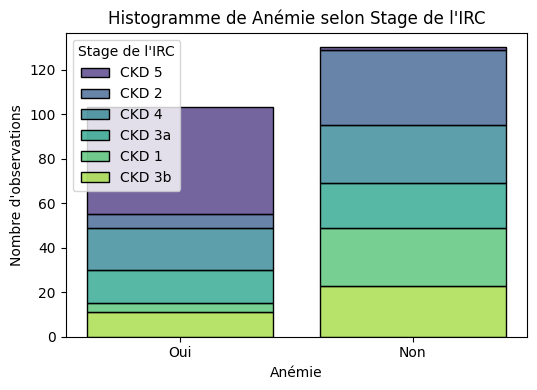

In [96]:
plot_histograms_by_stage(df, ['Anémie'], "Stage de l'IRC")

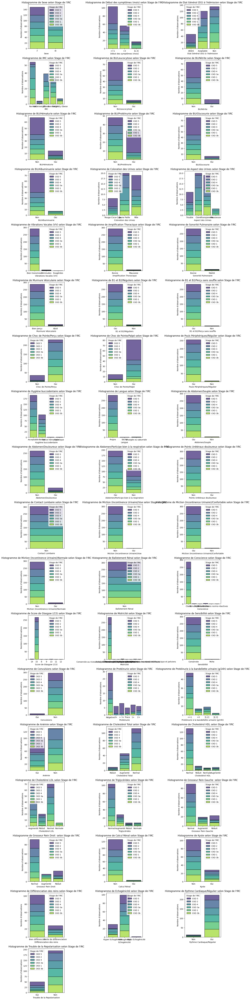

In [97]:
plot_histograms_by_stage(df, objects, "Stage de l'IRC")

In [98]:

from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='most_frequent')  # Remplace par la valeur la plus fréquente
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)


In [99]:

df.loc[
       (df['Protéinurie'] == 'Négative') &
       (df['BU/Protéinurie'].isna()) &
       (~df['Protéinurie'].isna()), 'BU/Protéinurie' ]="Non"

In [100]:
cat_temp= df[objects]

In [101]:
cat_temp

,Sexe,Début des symptômes (mois),Etat Général (EG) à l'Admission,IMC,BU/Leucocytose,BU/Nitrite,BU/Hématurie,BU/Protéinurie,BU/Glucosurie,BU/Albuminuerie,...,Cholestérol LDL,Triglycérides,Grosseur Rein Gauche,Grosseur Rein Droit,Calcul Rénal,Kyste,Différenciation des reins,Echogénicité,Rythme Cardiaque/Régulier,Trouble de la Repolarisation
0,F,<=1,Altéré,NaN,Non,Non,Non,Non,Non,Non,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,M,>3,Altéré,NaN,Non,Oui,Non,Oui,Non,Non,...,NaN,NaN,Normal,Normal,Non,Non,Bien différenciés,Hyper Echogénicité,NaN,NaN
2,F,<=1,Altéré,NaN,Non,Non,Non,Non,Non,Non,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M,>3,Altéré,NaN,Non,Non,Oui,Oui,Non,Non,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Oui
4,F,>3,Aceptable,NaN,Non,Non,Non,Oui,Non,Non,...,NaN,NaN,Normal,Normal,Non,Non,Bien différenciés,Homogénéité,Non,Non
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,F,>3,Bon,Overweight,Non,Non,Non,Oui,Non,Non,...,Réduit,Normal,NaN,NaN,NaN,NaN,NaN,NaN,Oui,Non
302,F,NaN,Bon,Overweight,NaN,NaN,NaN,NaN,NaN,NaN,...,Normal,Normal,Augmenté,Augmenté,Non,Non,Perte de différenciation,Homogénéité,Oui,Non
303,F,NaN,Bon,Obese,NaN,NaN,NaN,NaN,NaN,NaN,...,Normal,Normal,NaN,NaN,NaN,NaN,NaN,NaN,Oui,Non
304,F,<=1,Bon,Obese,Non,Non,Non,Non,Non,Non,...,NaN,NaN,Normal,Normal,Non,Non,Bien différenciés,Homogénéité,Oui,Non


In [102]:
df['Score de Glasgow (/15)'].fillna('15', inplace=True)

<ipython-input-102-141050f54729>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Score de Glasgow (/15)'].fillna('15', inplace=True)


In [103]:
#fill na cat_temp
cat_temp = cat_temp.fillna('Aucun')

In [104]:
len(df.select_dtypes(include='object').columns)

152

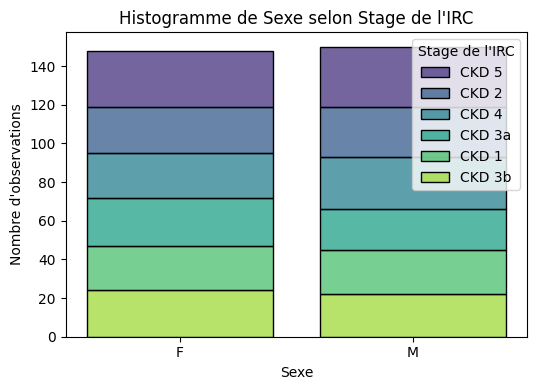

In [105]:
plot_histograms_by_stage(df,['Sexe'],"Stage de l'IRC")

In [106]:
1

1

In [107]:
all_obj = ['Début des symptômes (mois)', "Etat Général (EG) à l'Admission", 'IMC',
       'BU/Protéinurie', 'Choc de Pointe/Perçu',
       'Pouls Périphériques/Régulier', 'Abdomen/Douloureux',
       'Abdomen/Participe bien à la respiration',
       'Miction (Incontinence Urinaire)/Normale', 'Conscience', 'Convulsions',
       'Anémie', 'Grosseur Rein Gauche ', 'Grosseur Rein Droit ',
       'Trouble de la Repolarisation',"Stage de l'IRC"],

In [108]:
# plot_histograms_by_stage(cat_temp, objects, "Stage de l'IRC")

In [109]:
cat_temp["Stage de l'IRC"]=df["Stage de l'IRC"]

In [110]:
#columns where missing values are more than 50%
m_50 =df[objects].columns[df[objects].isna().sum()/df.shape[0] <= 0.3]

In [111]:
df[m_50].isna().sum()

,0
Sexe,8
Etat Général (EG) à l'Admission,5
Vibrations Vocales (VV),8
Amplification Thoracique,7
Sonorité Pulmonaire,13
Murmure Vésiculaire,7
B1 et B2/Réguliers,12
B1 et B2/Perçu sans souffle,19
Choc de Pointe/Perçu,42
Pouls Périphériques/Régulier,47


In [112]:
# replace nan in objects col by SimpleImputer most frequent when missing values are more than 50%
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='most_frequent')  # Remplace par la valeur la plus fréquente
data_imputed = pd.DataFrame(imputer.fit_transform(df[m_50]), columns=m_50)

<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` va

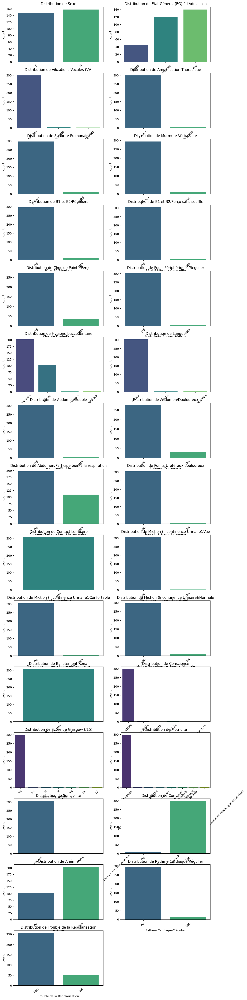

In [113]:
plot_categorical_histograms(data_imputed, m_50)

In [114]:
data_imputed.isna().sum()

,0
Sexe,0
Etat Général (EG) à l'Admission,0
Vibrations Vocales (VV),0
Amplification Thoracique,0
Sonorité Pulmonaire,0
Murmure Vésiculaire,0
B1 et B2/Réguliers,0
B1 et B2/Perçu sans souffle,0
Choc de Pointe/Perçu,0
Pouls Périphériques/Régulier,0


In [115]:
cat_temp[m_50]=data_imputed

In [116]:
m_others = df[objects].columns[df[objects].isna().sum()/df.shape[0] >=0.5]
m_others

Index(['IMC', 'BU/Leucocytose', 'BU/Nitrite', 'BU/Hématurie', 'BU/Protéinurie',
       'BU/Glucosurie', 'BU/Albuminuerie', 'Coloration des Urines',
       'Aspect des Urines', 'Choc de Pointe/Palpé', 'Protéinurie',
       'Protéinurie à la bandellette urinaire (g/24h)', 'Cholestérol LDL',
       'Triglycérides', 'Grosseur Rein Gauche ', 'Grosseur Rein Droit ',
       'Calcul Rénal', 'Kyste', 'Différenciation des reins', 'Echogénicité'],
      dtype='object')

In [117]:
df[m_others].isna().sum()

,0
IMC,169
BU/Leucocytose,225
BU/Nitrite,225
BU/Hématurie,225
BU/Protéinurie,214
BU/Glucosurie,225
BU/Albuminuerie,225
Coloration des Urines,259
Aspect des Urines,253
Choc de Pointe/Palpé,211


In [118]:
#fill na m_others columns
cat_temp[m_others] = df[m_others].fillna('Aucun')

<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, ax=axes[i], palette="viridis")
<ipython-input-4-7113df2d43d1>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` va

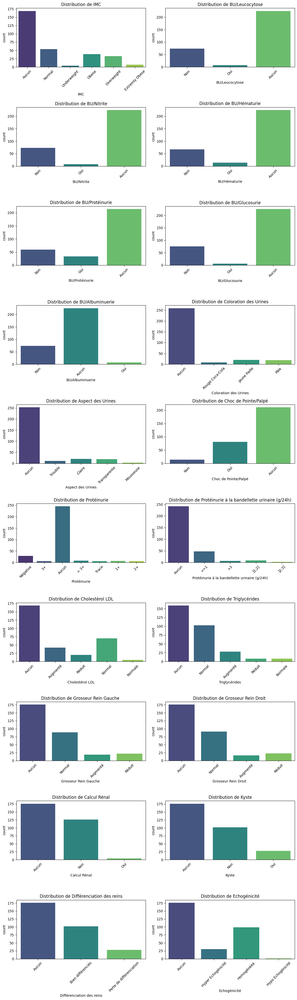

In [119]:
plot_categorical_histograms(cat_temp, m_others)

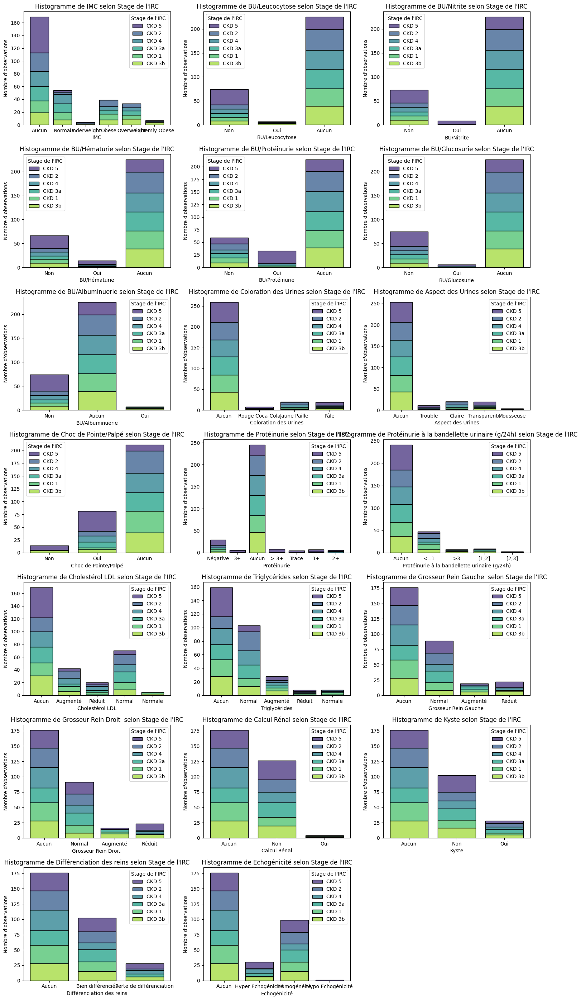

In [120]:
plot_histograms_by_stage(cat_temp, m_others, "Stage de l'IRC")

In [121]:
import numpy as np
import pandas as pd
import scipy.stats as stats

def chi2_and_cramers_v(df, variables, variable_cible):

  chi2_results = []

  for var in variables:
      # Table de contingence
      contingency_table = pd.crosstab(df[var], df[variable_cible])

      # Test du chi-carré
      chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

      # Résultats
      chi2_results.append({
          'Variable': var,
          'Chi2': chi2,
          'P-value': p,
          'Degrés de liberté': dof,
          'Association significative': 'Oui' if p < 0.05 else 'Non'
      })

  # DataFrame résultant
  chi2_df = pd.DataFrame(chi2_results)

  # Calcul du V de Cramér pour chaque ligne du DataFrame existant
  cramers_v_list = []

  for index, row in chi2_df.iterrows():
      contingency_table = pd.crosstab(df[variables[index]], df[variable_cible])

      # Calcul du V de Cramér
      chi2 = row['Chi2']  # Récupère la statistique du test chi2 de la ligne
      n = contingency_table.sum().sum()  # Nombre total d'observations
      min_dim = min(contingency_table.shape) - 1  # Prendre la dimension minimale moins 1
      cramers_v = np.sqrt(chi2 / (n * min_dim))  # Calcul de V de Cramér

      # Ajouter le V de Cramér dans la liste
      cramers_v_list.append(cramers_v)

  # Ajouter la colonne 'V de Cramér' au DataFrame existant
  chi2_df['V de Cramér'] = cramers_v_list

  return chi2_df

target_var = 'Stage de l\'IRC'
results= chi2_and_cramers_v(df, cat_temp.columns, target_var)

<ipython-input-121-ed552b7e3c16>:38: RuntimeWarning: invalid value encountered in divide
  cramers_v = np.sqrt(chi2 / (n * min_dim))  # Calcul de V de Cramér
<ipython-input-121-ed552b7e3c16>:38: RuntimeWarning: invalid value encountered in divide
  cramers_v = np.sqrt(chi2 / (n * min_dim))  # Calcul de V de Cramér


In [122]:
results

,Variable,Chi2,P-value,Degrés de liberté,Association significative,V de Cramér
0,Sexe,0.888066,9.710796e-01,5,Non,0.054590
1,Début des symptômes (mois),25.299278,4.806189e-03,10,Oui,0.268091
2,Etat Général (EG) à l'Admission,65.889049,2.738983e-10,10,Oui,0.330833
3,IMC,34.704451,2.173604e-02,20,Oui,0.251653
4,BU/Leucocytose,2.975642,7.037414e-01,5,Non,0.191667
5,BU/Nitrite,8.562601,1.278347e-01,5,Non,0.325132
6,BU/Hématurie,1.315628,9.333154e-01,5,Non,0.127445
7,BU/Protéinurie,29.351887,1.977801e-05,5,Oui,0.564838
8,BU/Glucosurie,4.669412,4.575415e-01,5,Non,0.240098
9,BU/Albuminuerie,9.929537,7.725659e-02,5,Non,0.350124


In [123]:
#print oui association
good= results[results['Association significative'] == 'Oui']['Variable'].unique()

In [124]:
#print non association
results[results['Association significative'] == 'Non']

,Variable,Chi2,P-value,Degrés de liberté,Association significative,V de Cramér
0,Sexe,0.888066,0.971080,5,Non,0.054590
4,BU/Leucocytose,2.975642,0.703741,5,Non,0.191667
5,BU/Nitrite,8.562601,0.127835,5,Non,0.325132
6,BU/Hématurie,1.315628,0.933315,5,Non,0.127445
8,BU/Glucosurie,4.669412,0.457541,5,Non,0.240098
9,BU/Albuminuerie,9.929537,0.077257,5,Non,0.350124
10,Coloration des Urines,12.652895,0.243731,10,Non,0.366886
11,Aspect des Urines,18.223052,0.251121,15,Non,0.338542
12,Vibrations Vocales (VV),8.518338,0.578341,10,Non,0.119551
13,Amplification Thoracique,4.148898,0.528184,5,Non,0.117796


In [125]:
good =list(good)
good

['Début des symptômes (mois)',
 "Etat Général (EG) à l'Admission",
 'IMC',
 'BU/Protéinurie',
 'Choc de Pointe/Perçu',
 'Pouls Périphériques/Régulier',
 'Abdomen/Douloureux',
 'Abdomen/Participe bien à la respiration',
 'Miction (Incontinence Urinaire)/Normale',
 'Conscience',
 'Convulsions',
 'Anémie',
 'Grosseur Rein Gauche ',
 'Grosseur Rein Droit ',
 'Trouble de la Repolarisation',
 "Stage de l'IRC"]

In [126]:
df_second = df.copy()

In [127]:
df_second[cat_temp.columns]=cat_temp

In [128]:
num_var= df_second.select_dtypes(include=['float']).columns
num_var

Index(['Age', 'TA (mmHg)/Systole', 'TA (mmHg)/Diastole', 'Poul (bpm)',
       'Glycémie à jeun (taux de Glucose)', 'Urée (g/L)', 'Créatinine (mg/L)',
       'Na^+ (meq/L)', 'K^+ (meq/L)', 'Ca^2+ (meq/L)', 'Cl^- (meq/L)',
       'Hb (g/dL)'],
      dtype='object')

In [129]:
df_second[num_var].isna().sum()

,0
Age,8
TA (mmHg)/Systole,61
TA (mmHg)/Diastole,61
Poul (bpm),69
Glycémie à jeun (taux de Glucose),87
Urée (g/L),23
Créatinine (mg/L),0
Na^+ (meq/L),35
K^+ (meq/L),30
Ca^2+ (meq/L),91


In [130]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Sélection des colonnes catégorielles
categorical_cols = df_second.select_dtypes(include=['object']).columns

# Initialisation du OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Encodage des variables catégorielles
encoded_categorical = encoder.fit_transform(df_second[categorical_cols])

# Conversion en DataFrame avec les noms de colonnes corrects
encoded_categorical_df = pd.DataFrame(encoded_categorical, columns=encoder.get_feature_names_out(categorical_cols), index=df_second.index)

# Suppression des anciennes colonnes catégorielles et concaténation avec les nouvelles colonnes encodées
df_second = df_second.drop(columns=categorical_cols).join(encoded_categorical_df)

print(df_second.head())  # Vérifier le résultat


    Age  TA (mmHg)/Systole  TA (mmHg)/Diastole  Poul (bpm)  \
0  50.0              140.0                80.0        85.0   
1  28.0              130.0                80.0       110.0   
2  69.0               93.0                34.0        19.0   
3  68.0              130.0                70.0        82.0   
4  68.0              225.0               111.0        69.0   

   Glycémie à jeun (taux de Glucose)  Urée (g/L)  Créatinine (mg/L)  \
0                                NaN        1.29              169.0   
1                                NaN        0.66               17.0   
2                               2.87        0.79               48.0   
3                               1.00        1.14               42.0   
4                                NaN         NaN              500.0   

   Na^+ (meq/L)  K^+ (meq/L)  Ca^2+ (meq/L)  ...  Stage de l'IRC_CKD 1  \
0         131.0          6.4           82.0  ...                   0.0   
1         134.0          5.3            NaN  ...    

In [131]:
#impute numerical columns with KnnImputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
data_imputed = pd.DataFrame(imputer.fit_transform(df_second), columns=df_second.columns)

<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be 

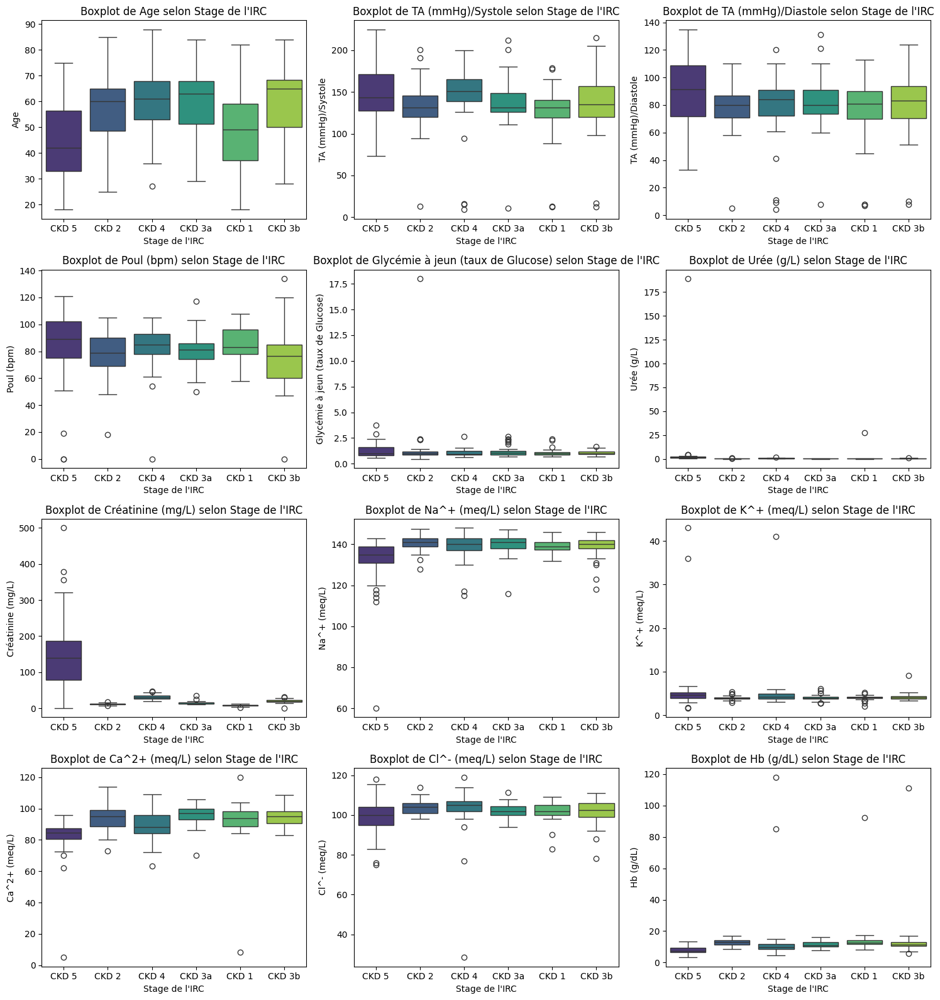

In [132]:
#before
plot_boxplots_by_stage(df,num_var,"Stage de l'IRC")


In [133]:
# #before
# plot_boxplots_by_stage(data_imputed,num_var,"Stage de l'IRC")


In [134]:
data_imputed[num_var].isna().sum()

,0
Age,0
TA (mmHg)/Systole,0
TA (mmHg)/Diastole,0
Poul (bpm),0
Glycémie à jeun (taux de Glucose),0
Urée (g/L),0
Créatinine (mg/L),0
Na^+ (meq/L),0
K^+ (meq/L),0
Ca^2+ (meq/L),0


In [135]:
#list of object type variables in df
cat_df=df.select_dtypes(include=['object']).columns

In [136]:
print(cat_df)

Index(['Sexe', 'Motif(s) d'Admission/Asthénie',
       'Motif(s) d'Admission/Altération de la fonction rénale',
       'Motif(s) d'Admission/HTA', 'Motif(s) d'Admission/Œdème',
       'Motif(s) d'Admission/Diabète',
       'Motif(s) d'Admission/Douleur abdominale', 'Autres Motifs d'Admission',
       'Personnels Médicaux/HTA', 'Personnels Médicaux/Diabète 1',
       ...
       'Pathologies/Rétinopathie hypertensive',
       'Pathologies/Rétinopathie diabétique', 'Pathologies/Glaucome',
       'Autres Pathologies', 'Rythme Cardiaque/Sinusal',
       'Rythme Cardiaque/Régulier', 'Trouble de la Repolarisation',
       'Stage de l'IRC', 'Causes Majeure après Diagnostic/HTA',
       'Causes Majeure après Diagnostic/Diabète'],
      dtype='object', length=152)


In [137]:
len(cat_df)

152

In [138]:
df_save =df.copy()
df_save[cat_temp.columns]=cat_temp

In [139]:
#give isna sum for colum with this sum non null
df_save[cat_temp.columns].isna().sum()

,0
Sexe,0
Début des symptômes (mois),0
Etat Général (EG) à l'Admission,0
IMC,0
BU/Leucocytose,0
BU/Nitrite,0
BU/Hématurie,0
BU/Protéinurie,0
BU/Glucosurie,0
BU/Albuminuerie,0


In [140]:
df_save.to_csv('final.csv', index=False)

In [141]:
#Proposition entrainement + Featre selection

import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# Exemple de jeu de données
data = pd.DataFrame({
    'stade_IRC': ['Stade 1', 'Stade 2', None, 'Stade 3', 'Stade 4', None, 'Stade 2'],
    'âge': [25, 45, 34, None, 60, 50, 40],
    'target': [0, 1, 0, 1, 1, 0, 1]
})

# Séparation des caractéristiques et de la cible
X = data.drop(columns=['target'])
y = data['target']

# Préprocesseur pour les variables catégorielles
categorical_cols = ['stade_IRC']
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols)
    ],
    remainder='passthrough'
)

# Création du pipeline avec imputation, sélection de variables et modèle
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('imputer', KNNImputer(n_neighbors=5)),  # Imputation par KNN
    ('selector', SelectKBest(score_func=chi2, k=3)),  # Sélection des k meilleures features
    ('model', LogisticRegression())
])

# Validation croisée pour évaluer l'ensemble du pipeline
scores = cross_val_score(pipeline, X, y, cv=3)
print("Scores:", scores)
print("Score moyen:", scores.mean())


Scores: [1.  1.  0.5]
Score moyen: 0.8333333333333334


<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be 

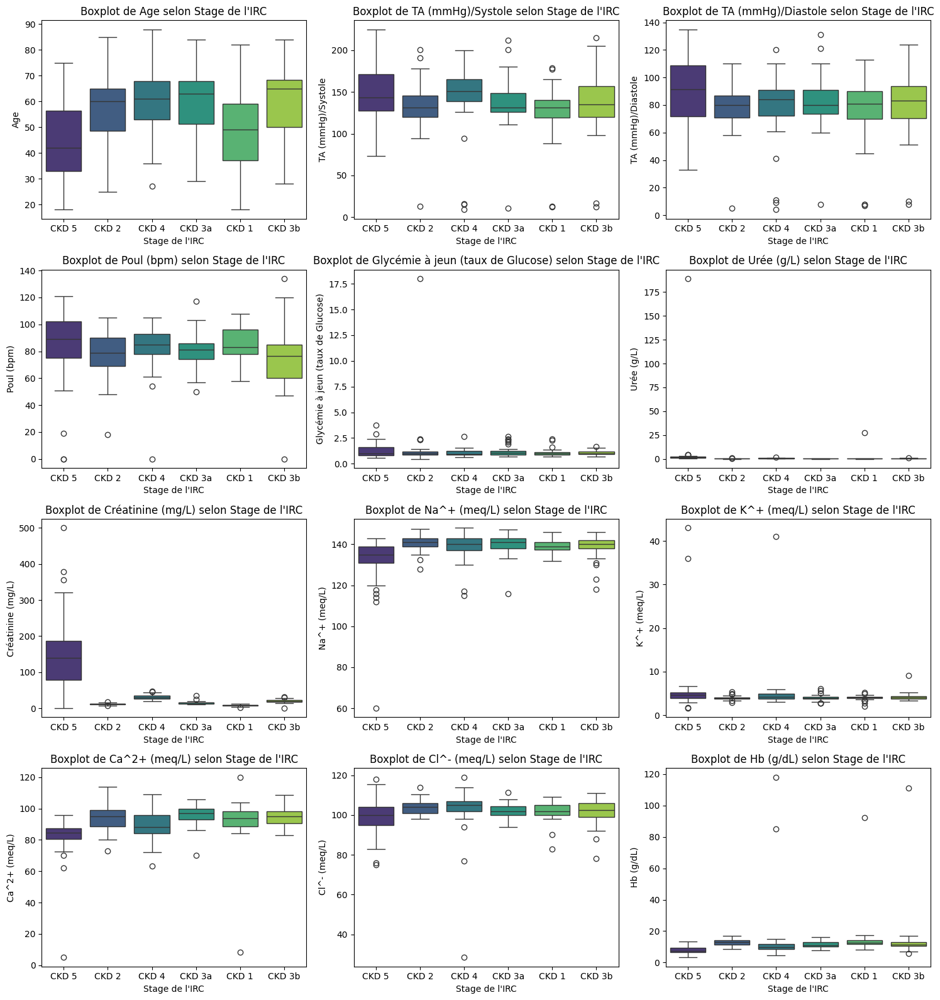

In [142]:
plot_boxplots_by_stage(df_save,num_var,"Stage de l'IRC")

<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=var, ax=axes[i], palette="viridis")
<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=var, ax=axes[i], palette="viridis")
<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, y=var, ax=axes[i], palette="viridis")
<ipython-input-6-afbc523488a5>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable

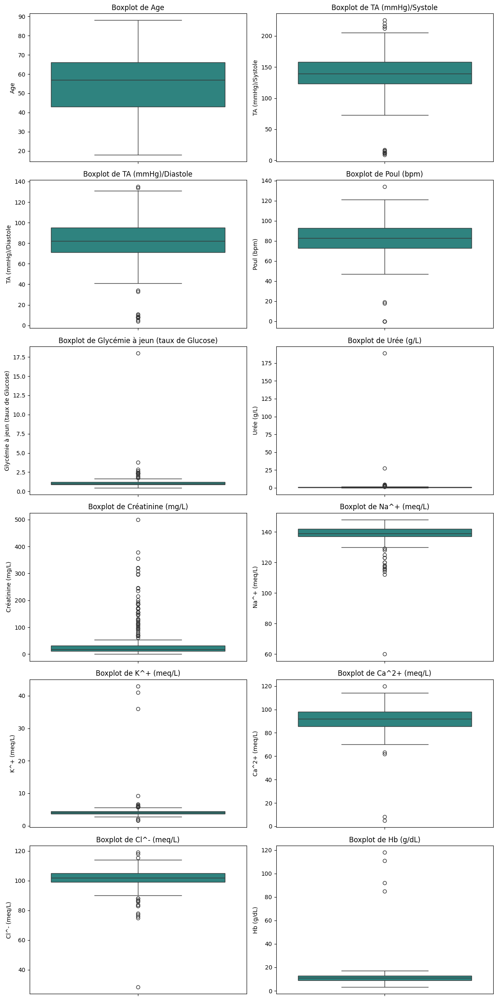

In [143]:
plot_numeric_boxplots(df_save,num_var)

In [144]:
df_save['TA (mmHg)/Systole'].describe()

,TA (mmHg)/Systole
count,245.000000
mean,138.391837
std,35.868863
min,9.000000
25%,123.000000
50%,139.000000
75%,158.000000
max,225.000000


Seuil critique — hypotension sévère (systolique < 90 mmHg)

En général :

    < 90 mmHg : considéré comme une hypotension.

    < 80 mmHg : peut être mal tolérée (risque de choc hypovolémique, cardiogénique ou septique).

    < 70 mmHg : souvent incompatible avec une perfusion efficace des organes, en particulier chez les patients fragiles (insuffisance rénale, sepsis, etc.).

    < 60 mmHg : souvent considéré comme un seuil de danger vital immédiat, sauf exception très encadrée (coma protégé, réanimation..


 Seuil critique / maximum admis

    Une TA systolique > 180 mmHg est considérée comme dangereuse, même si le patient ne présente pas de symptômes immédiats.

    Une TA > 200–220 mmHg sans traitement peut entraîner :

        AVC (ischémique ou hémorragique),

        insuffisance cardiaque,

        dissection aortique,

        atteinte rénale aiguë.

Chez des patients atteints d’IRC, des valeurs > 160 mmHg sont souvent déjà considérées comme pathologiques.

In [145]:
df_save[(df_save['TA (mmHg)/Systole']<70) | (df_save['TA (mmHg)/Systole']>180)]['TA (mmHg)/Systole']

,TA (mmHg)/Systole
4,225.0
7,215.0
22,220.0
23,204.0
28,191.0
29,198.0
30,191.0
41,192.0
56,200.0
65,189.0


In [146]:
df_save[(df_save['TA (mmHg)/Systole']>120)]['TA (mmHg)/Systole']

,TA (mmHg)/Systole
0,140.0
1,130.0
3,130.0
4,225.0
5,150.0
...,...
298,134.0
299,133.0
301,174.0
303,145.0


In [147]:
df_save= df_save[(df_save['TA (mmHg)/Systole']>70)]

In [148]:
df_save['TA (mmHg)/Diastole'].describe()

,TA (mmHg)/Diastole
count,236.000000
mean,84.966102
std,18.591891
min,8.000000
25%,73.000000
50%,83.000000
75%,95.000000
max,135.000000


Seuils bas cliniquement préoccupants

    < 60 mmHg : Hypotension diastolique.

    < 50 mmHg : Mauvaise perfusion coronaire (risque d'ischémie myocardique).

    < 40 mmHg : Danger immédiat chez la plupart des patients.

 Seuils hauts cliniquement critiques

    > 90 mmHg : Début de l’HTA (si confirmé).

    > 100 mmHg : Hypertension modérée à sévère.

    > 110–120 mmHg : Risque d’urgence hypertensive, surtout si symptômes neurologiques, visuels ou douleur thoraciqu

In [149]:
df_save[df_save['TA (mmHg)/Diastole'] <50]['TA (mmHg)/Diastole']

,TA (mmHg)/Diastole
2,34.0
16,43.0
43,33.0
61,8.0
170,45.0
188,41.0


8.0 mmHg → non physiologique sauf arrêt cardiaque ou choc profond, probablement une erreur de saisie ou une condition extrême.

In [150]:
df_save=df_save[df_save['TA (mmHg)/Diastole'] !=8]

In [151]:
df_save['Poul (bpm)'].describe()

,Poul (bpm)
count,199.000000
mean,83.236181
std,17.457003
min,0.000000
25%,73.500000
50%,84.000000
75%,93.500000
max,121.000000


📉 Bas trop bas ?

    < 50–60 bpm : acceptable chez les sportifs, mais sinon → à surveiller.

    < 40 bpm : bradycardie sévère, souvent problématique sauf exceptions.

📈 Trop haut ?

        100 bpm : tachycardie (stress, fièvre, déshydratation, etc.)

        120 bpm : souvent signe d’un problème important

In [152]:
df_save[(df_save['Poul (bpm)']<40) | (df_save['Poul (bpm)']>200)]['Poul (bpm)']

,Poul (bpm)
2,19.0
49,0.0


Impossibles ou à vérifier les lignes avec :

    pouls <= 20

    pouls >= 200

    pouls == 0 (surtout si le patient a une TA > 0)

In [153]:
df_save=df_save[(df_save['Poul (bpm)']>40)]

In [154]:
df_save[df_save['Poul (bpm)']==121][['Poul (bpm)','TA (mmHg)/Diastole','TA (mmHg)/Systole']]

,Poul (bpm),TA (mmHg)/Diastole,TA (mmHg)/Systole
27,121.0,93.0,127.0


In [155]:
df_save['Glycémie à jeun (taux de Glucose)'].describe()

,Glycémie à jeun (taux de Glucose)
count,123.000000
mean,1.241463
std,1.594577
min,0.470000
25%,0.860000
50%,0.970000
75%,1.145000
max,18.000000


Glycémie normale (à jeun) : 0.7 – 1.0 g/L

Critique basse : < 0.5 g/L

Critique haute : > 2.0 g/L

Très suspecte / impossible : < 0.2 ou > 5

In [156]:
df_save[df_save['Glycémie à jeun (taux de Glucose)']<0.5]['Glycémie à jeun (taux de Glucose)']

,Glycémie à jeun (taux de Glucose)
160,0.47


In [157]:
df_save =df_save[df_save['Glycémie à jeun (taux de Glucose)']!=18]

<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")


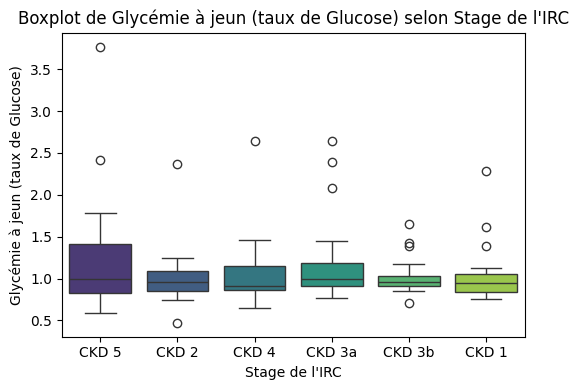

In [158]:
plot_boxplots_by_stage(df_save,['Glycémie à jeun (taux de Glucose)'],"Stage de l'IRC")

In [159]:
df_save['Urée (g/L)'].describe()

,Urée (g/L)
count,183.000000
mean,2.011913
std,14.063914
min,0.060000
25%,0.280000
50%,0.490000
75%,1.140000
max,189.000000


🚨 Valeurs extrêmes et impossibles :

    > 5.0 g/L : C’est très élevé et pourrait indiquer un état d'urémie sévère (si non traité).

        À ce niveau, l'urée dans le sang peut affecter le cerveau et entraîner une confusion mentale, des convulsions ou un coma.

        > 10 g/L : Les valeurs aussi élevées sont rarement observées sans soins intensifs ou dialyse.



In [160]:
df_save[df_save['Urée (g/L)']>5]['Urée (g/L)']

,Urée (g/L)
6,189.0
243,27.7


In [161]:
df_save=df_save[df_save['Urée (g/L)']<=5]

In [162]:
df_save[df_save['Urée (g/L)']>=4]['Urée (g/L)']

,Urée (g/L)
19,4.41
30,4.20
48,4.41


In [163]:
df_save['Créatinine (mg/L)'].describe()

,Créatinine (mg/L)
count,181.000000
mean,53.926657
std,78.245361
min,0.245000
25%,12.000000
50%,18.000000
75%,42.000000
max,379.000000


In [164]:
df_save[df_save['Créatinine (mg/L)']>200]

,Sexe,Age,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Autres Motifs d'Admission,Personnels Médicaux/HTA,...,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Autres Pathologies,Rythme Cardiaque/Sinusal,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète
8,F,42.0,1,0,0,0,0,0,Aucun,1,...,1,0,0,Aucun,1,Oui,Non,CKD 5,1,0
10,M,38.0,0,0,0,0,0,1,Aucun,1,...,0,0,0,Aucun,1,Oui,Oui,CKD 5,0,0
13,M,31.0,0,1,0,0,0,0,Aucun,0,...,0,0,0,Aucun,0,Oui,Non,CKD 5,0,0
19,M,45.0,0,1,0,0,0,0,Aucun,1,...,0,0,0,Aucun,0,Oui,Non,CKD 5,1,0
22,M,29.0,0,1,0,0,0,0,Aucun,1,...,0,0,0,Aucun,0,Oui,Non,CKD 5,1,0
24,M,32.0,0,1,0,0,0,0,Aucun,1,...,0,0,0,Aucun,1,Oui,Oui,CKD 5,1,0
30,M,47.0,0,1,1,0,0,0,Aucun,1,...,0,0,0,Aucun,1,Oui,Oui,CKD 5,0,0
39,F,29.0,1,1,0,0,0,0,Aucun,1,...,0,0,0,Aucun,0,Oui,Non,CKD 5,1,0
45,F,62.0,0,1,0,0,0,0,Aucun,1,...,1,0,0,Aucun,1,Oui,Non,CKD 5,1,0
48,M,40.0,0,1,0,0,0,0,Aucun,1,...,0,0,0,Aucun,1,Oui,Non,CKD 5,1,0


In [165]:
df_save=df_save[df_save['Créatinine (mg/L)']!=0.245]

In [166]:
df_save['Na^+ (meq/L)'].describe()

,Na^+ (meq/L)
count,161.00000
mean,137.22795
std,9.17492
min,60.00000
25%,136.00000
50%,139.00000
75%,142.00000
max,148.00000


Plage normale du sodium (Na⁺) :

    Plage normale : 135-145 meq/L

    Des valeurs inférieures à 135 meq/L sont considérées comme un signe de hyponatrémie (taux trop bas de sodium dans le sang).

    Des valeurs supérieures à 145 meq/L indiquent une hypernatrémie (taux trop élevé de sodium), qui peut être causée par une déshydratation, un excès de sel ou des troubles rénaux.

Analyse de la valeur de Na⁺ (meq/L) :

    Une valeur de Na⁺ très basse, comme < 120 meq/L, peut être cliniquement préoccupante et nécessite une attention immédiate pour diagnostiquer la cause sous-jacente, qui peut être un déséquilibre hydrique, une insuffisance cardiaque, une insuffisance rénale ou des troubles hormonaux.

    Une valeur de Na⁺ > 160 meq/L est également préoccupante, suggérant généralement une déshydratation sévère ou une altération de la fonction rénale.

Valeurs cliniquement préoccupantes :

    Inférieures à 110 meq/L ou supérieures à 180 meq/L : Ces valeurs seraient exceptionnelles et très rares dans les contextes cliniques courants. Une valeur comme Na⁺ = 8 meq/L ou Na⁺ > 180 meq/L serait probablement due à une erreur de mesure ou un problème d'échantillonnage

<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")


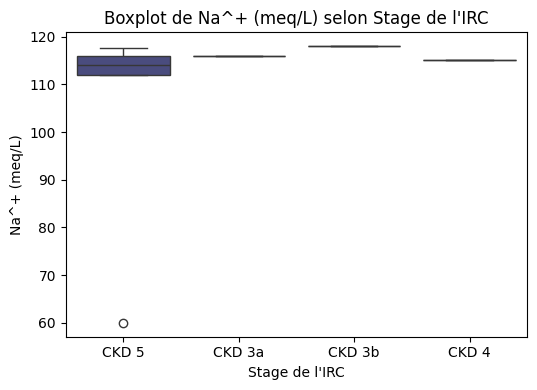

In [167]:
plot_boxplots_by_stage(df_save[df_save['Na^+ (meq/L)']< 120],['Na^+ (meq/L)'],"Stage de l'IRC")

60.0 meq/L : Ceci est une valeur très anormale et cliniquement impossible dans la plupart des cas médicaux. Elle suggère probablement une erreur de mesure.

In [168]:
df_save=df_save[df_save['Na^+ (meq/L)']!=60]

In [169]:
df_save['K^+ (meq/L)'].describe()

,K^+ (meq/L)
count,164.000000
mean,4.641585
std,4.230465
min,1.600000
25%,3.800000
50%,4.100000
75%,4.625000
max,43.000000


In [170]:
df_save[df_save['K^+ (meq/L)']<25]['K^+ (meq/L)']

,K^+ (meq/L)
0,6.4
1,5.3
3,5.7
5,5.1
7,3.8
...,...
299,5.2
300,4.1
301,3.6
303,4.2


In [171]:
df_save[df_save['K^+ (meq/L)']>5]['K^+ (meq/L)']

,K^+ (meq/L)
0,6.40
1,5.30
3,5.70
5,5.10
10,6.60
13,5.60
16,5.20
19,5.33
22,5.90
27,5.90


In [172]:
df_save=df_save[df_save['K^+ (meq/L)']!=41]

In [173]:
num_var

Index(['Age', 'TA (mmHg)/Systole', 'TA (mmHg)/Diastole', 'Poul (bpm)',
       'Glycémie à jeun (taux de Glucose)', 'Urée (g/L)', 'Créatinine (mg/L)',
       'Na^+ (meq/L)', 'K^+ (meq/L)', 'Ca^2+ (meq/L)', 'Cl^- (meq/L)',
       'Hb (g/dL)'],
      dtype='object')

In [174]:
df_save['Ca^2+ (meq/L)'].describe()

,Ca^2+ (meq/L)
count,123.000000
mean,89.853252
std,12.259057
min,4.910000
25%,85.000000
50%,91.000000
75%,97.000000
max,114.000000


In [175]:
df_save[(df_save['Ca^2+ (meq/L)']>=10) | (df_save['Ca^2+ (meq/L)']<4)]['Ca^2+ (meq/L)']

,Ca^2+ (meq/L)
0,82.0
3,88.0
7,87.0
8,88.0
9,85.0
...,...
297,92.0
300,88.0
301,96.0
303,95.0


In [178]:
df_save[(df_save['Ca^2+ (meq/L)']>=20)]['Ca^2+ (meq/L)']

,Ca^2+ (meq/L)
0,82.0
3,88.0
7,87.0
8,88.0
9,85.0
...,...
297,92.0
300,88.0
301,96.0
303,95.0


In [180]:
df_save['Cl^- (meq/L)'].describe()

,Cl^- (meq/L)
count,150.000000
mean,100.760867
std,9.176199
min,28.330000
25%,99.000000
50%,102.000000
75%,105.000000
max,119.000000


In [181]:
df_save['Hb (g/dL)'].describe()

,Hb (g/dL)
count,148.000000
mean,12.613649
std,15.289944
min,3.200000
25%,8.300000
50%,10.400000
75%,12.600000
max,118.000000


In [187]:
df_save[df_save['Hb (g/dL)']>18]['Hb (g/dL)'].describe()

,Hb (g/dL)
count,4.000000
mean,101.565000
std,15.493124
min,85.000000
25%,90.445000
50%,101.630000
75%,112.750000
max,118.000000


In [188]:
df_save=df_save[df_save['Hb (g/dL)']<18]

In [189]:
df_save.to_csv('final_clean.csv', index=False)

In [191]:
df_save["Stage de l'IRC"].value_counts()

,count
Stage de l'IRC,
CKD 5,44
CKD 4,23
CKD 2,20
CKD 3a,20
CKD 3b,19
CKD 1,18


In [193]:
df_save[num_var].isna().sum()

,0
Age,3
TA (mmHg)/Systole,0
TA (mmHg)/Diastole,0
Poul (bpm),0
Glycémie à jeun (taux de Glucose),52
Urée (g/L),0
Créatinine (mg/L),0
Na^+ (meq/L),12
K^+ (meq/L),9
Ca^2+ (meq/L),40


<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")
<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be 

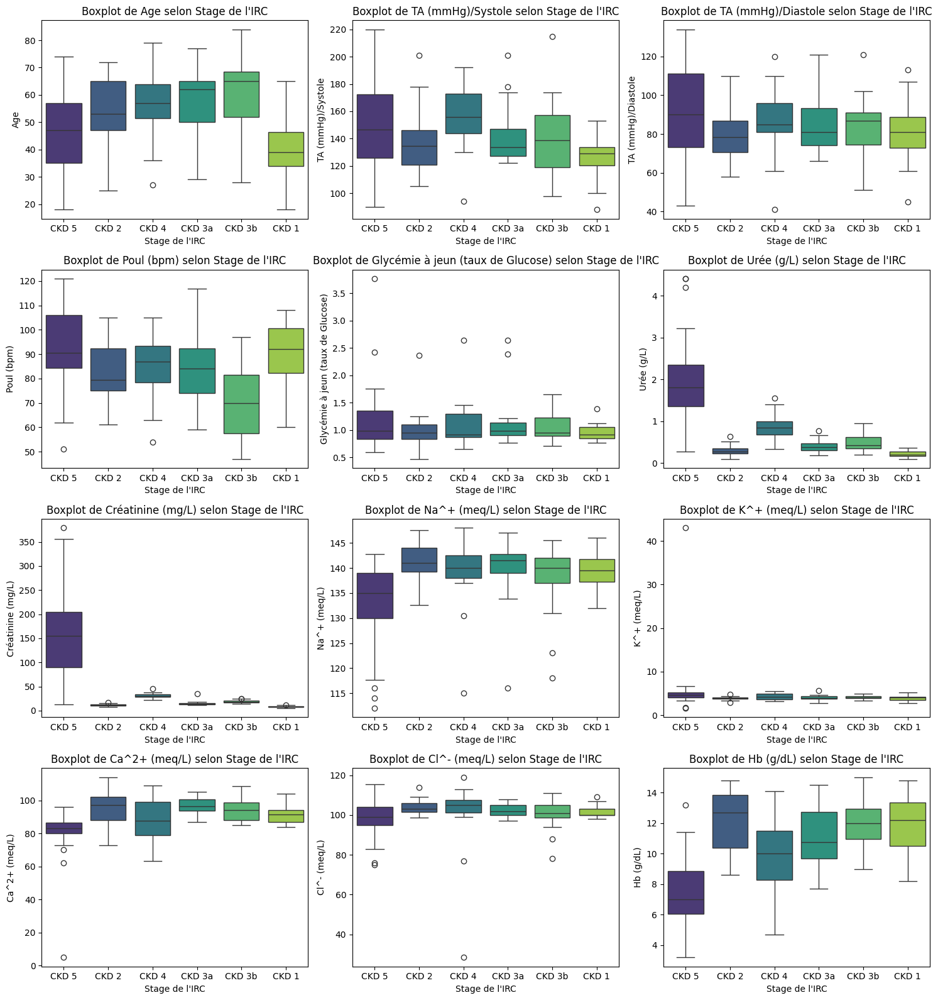

In [194]:
plot_boxplots_by_stage(df_save,num_var,"Stage de l'IRC")

In [195]:
df =pd.read_csv('final.csv')

In [196]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Columns: 164 entries, Sexe to Causes Majeure après Diagnostic/Diabète
dtypes: float64(12), int64(61), object(91)
memory usage: 392.2+ KB


In [197]:
import pandas as pd
import numpy as np
from scipy.stats import f_oneway, kruskal, ttest_ind

def relation_num_categ(df, target_col, use_nonparametric=False, alpha=0.05):
    results = []

    num_cols = df.select_dtypes(include=np.number).columns.tolist()
    num_cols = [col for col in num_cols if col != target_col]

    categories = df[target_col].dropna().unique()
    n_classes = len(categories)

    for col in num_cols:
        groups = [df[df[target_col] == cat][col].dropna() for cat in categories]

        if any(len(g) < 2 for g in groups):
            continue

        try:
            if use_nonparametric:
                stat, p = kruskal(*groups)
                test_used = "Kruskal-Wallis"
            elif n_classes == 2:
                stat, p = ttest_ind(*groups)
                test_used = "t-test"
            else:
                stat, p = f_oneway(*groups)
                test_used = "ANOVA"
        except Exception as e:
            stat, p = np.nan, np.nan
            test_used = "Erreur"

        association = "Oui" if p < alpha else "Non"

        results.append({
            "Variable": col,
            "Test utilisé": test_used,
            "Statistique": stat,
            "p-value": p,
            "Association significative": association
        })

    result_df = pd.DataFrame(results)
    result_df = result_df.sort_values(by="p-value")
    return result_df


In [201]:
numer= list(num_var)+["Stage de l'IRC"]
numer

['Age',
 'TA (mmHg)/Systole',
 'TA (mmHg)/Diastole',
 'Poul (bpm)',
 'Glycémie à jeun (taux de Glucose)',
 'Urée (g/L)',
 'Créatinine (mg/L)',
 'Na^+ (meq/L)',
 'K^+ (meq/L)',
 'Ca^2+ (meq/L)',
 'Cl^- (meq/L)',
 'Hb (g/dL)',
 "Stage de l'IRC"]

In [202]:
table = relation_num_categ(df[numer], target_col="Stage de l'IRC", use_nonparametric=False)
table


,Variable,Test utilisé,Statistique,p-value,Association significative
6,Créatinine (mg/L),ANOVA,89.871004,1.515934e-57,Oui
0,Age,ANOVA,12.546585,4.792594e-11,Oui
7,Na^+ (meq/L),ANOVA,9.473285,2.518053e-08,Oui
9,Ca^2+ (meq/L),ANOVA,8.412508,2.866340e-07,Oui
11,Hb (g/dL),ANOVA,2.674450,2.241873e-02,Oui
10,Cl^- (meq/L),ANOVA,2.647312,2.360540e-02,Oui
2,TA (mmHg)/Diastole,ANOVA,2.595204,2.620332e-02,Oui
3,Poul (bpm),ANOVA,2.510807,3.085630e-02,Oui
1,TA (mmHg)/Systole,ANOVA,2.443403,3.493464e-02,Oui
8,K^+ (meq/L),ANOVA,1.916221,9.182309e-02,Non


In [203]:
table = relation_num_categ(df[numer], target_col="Stage de l'IRC", use_nonparametric=True)
table


,Variable,Test utilisé,Statistique,p-value,Association significative
6,Créatinine (mg/L),Kruskal-Wallis,256.199499,2.568901e-53,Oui
5,Urée (g/L),Kruskal-Wallis,189.321476,5.455643e-39,Oui
11,Hb (g/dL),Kruskal-Wallis,108.591945,8.128599e-22,Oui
9,Ca^2+ (meq/L),Kruskal-Wallis,58.840390,2.109854e-11,Oui
0,Age,Kruskal-Wallis,51.499483,6.832778e-10,Oui
7,Na^+ (meq/L),Kruskal-Wallis,50.510422,1.089486e-09,Oui
10,Cl^- (meq/L),Kruskal-Wallis,24.379540,1.835202e-04,Oui
8,K^+ (meq/L),Kruskal-Wallis,23.592465,2.599673e-04,Oui
3,Poul (bpm),Kruskal-Wallis,20.529490,9.937385e-04,Oui
1,TA (mmHg)/Systole,Kruskal-Wallis,19.255789,1.722239e-03,Oui


In [216]:
colonnes_a_supprimer = [
    'Glycémie à jeun (taux de Glucose)',
    'K^+ (meq/L)'
]

df = df.drop(columns=colonnes_a_supprimer)


KeyError: "['Glycémie à jeun (taux de Glucose)', 'K^+ (meq/L)'] not found in axis"

In [207]:
results=chi2_and_cramers_v(df, cat_df, target_var)

<ipython-input-121-ed552b7e3c16>:38: RuntimeWarning: invalid value encountered in divide
  cramers_v = np.sqrt(chi2 / (n * min_dim))  # Calcul de V de Cramér
<ipython-input-121-ed552b7e3c16>:38: RuntimeWarning: invalid value encountered in divide
  cramers_v = np.sqrt(chi2 / (n * min_dim))  # Calcul de V de Cramér


,Variable,Chi2,P-value,Degrés de liberté,Association significative,V de Cramér
0,Sexe,0.408815,9.950833e-01,5,Non,0.036551
1,Autres Motifs d'Admission,75.128698,9.024327e-02,60,Non,0.221594
2,Autres Antécédents Personnels Médicaux,132.062115,5.554517e-01,135,Non,0.293794
3,Durée Diabète 1 (mois),10.998735,3.576166e-01,10,Non,0.134059
4,Durée Diabète 2 (mois),36.260474,1.996727e-01,30,Non,0.153947
...,...,...,...,...,...,...
86,Echogénicité,20.749188,1.450361e-01,15,Non,0.150342
87,Autres Pathologies,38.644630,5.312636e-01,40,Non,0.158927
88,Rythme Cardiaque/Régulier,2.963930,7.055469e-01,5,Non,0.098418
89,Trouble de la Repolarisation,11.194481,4.765748e-02,5,Oui,0.191268


In [206]:
#selects categorical variables in df
cat_df=df.select_dtypes(include=['object']).columns

In [209]:
#result where assciation is non
results[results['Association significative'] == 'Non']['Variable'].unique()

array(['Sexe', 'BU/Leucocytose', 'BU/Nitrite', 'BU/Hématurie',
       'BU/Glucosurie', 'BU/Albuminuerie', 'Coloration des Urines',
       'Aspect des Urines', 'Vibrations Vocales (VV)',
       'Amplification Thoracique', 'Sonorité Pulmonaire',
       'Murmure Vésiculaire', 'B1 et B2/Réguliers',
       'B1 et B2/Perçu sans souffle', 'Choc de Pointe/Palpé',
       'Hygiène buccodentaire', 'Langue', 'Abdomen/Souple',
       'Points Urétéraux douloureux', 'Contact Lombaire',
       'Miction (Incontinence Urinaire)/Vue',
       'Miction (Incontinence Urinaire)/Confortable', 'Ballotement Rénal',
       'Score de Glasgow (/15)', 'Motricité', 'Sensibilité',
       'Protéinurie', 'Protéinurie à la bandellette urinaire (g/24h)',
       'Cholestérol Total', 'Cholestérol HDL', 'Cholestérol LDL',
       'Triglycérides', 'Calcul Rénal', 'Kyste',
       'Différenciation des reins', 'Echogénicité',
       'Rythme Cardiaque/Régulier'], dtype=object)

In [211]:
to_drop= ['Sexe', 'BU/Leucocytose', 'BU/Nitrite', 'BU/Hématurie',
       'BU/Glucosurie', 'BU/Albuminuerie', 'Coloration des Urines',
       'Aspect des Urines', 'Vibrations Vocales (VV)',
       'Amplification Thoracique', 'Sonorité Pulmonaire',
       'Murmure Vésiculaire', 'B1 et B2/Réguliers',
       'B1 et B2/Perçu sans souffle', 'Choc de Pointe/Palpé',
       'Hygiène buccodentaire', 'Langue', 'Abdomen/Souple',
       'Points Urétéraux douloureux', 'Contact Lombaire',
       'Miction (Incontinence Urinaire)/Vue',
       'Miction (Incontinence Urinaire)/Confortable', 'Ballotement Rénal',
       'Score de Glasgow (/15)', 'Motricité', 'Sensibilité',
       'Protéinurie', 'Protéinurie à la bandellette urinaire (g/24h)',
       'Cholestérol Total', 'Cholestérol HDL', 'Cholestérol LDL',
       'Triglycérides', 'Calcul Rénal', 'Kyste',
       'Différenciation des reins', 'Echogénicité',
       'Rythme Cardiaque/Régulier']

In [212]:
df=df.drop(columns=to_drop)

In [213]:
df.columns

Index(['Age', 'Motif(s) d'Admission/Asthénie',
       'Motif(s) d'Admission/Altération de la fonction rénale',
       'Motif(s) d'Admission/HTA', 'Motif(s) d'Admission/Œdème',
       'Motif(s) d'Admission/Diabète',
       'Motif(s) d'Admission/Douleur abdominale', 'Autres Motifs d'Admission',
       'Personnels Médicaux/HTA', 'Personnels Médicaux/Diabète 1',
       ...
       'Grosseur Rein Droit ', 'Pathologies/Rétinopathie hypertensive',
       'Pathologies/Rétinopathie diabétique', 'Pathologies/Glaucome',
       'Autres Pathologies', 'Rythme Cardiaque/Sinusal',
       'Trouble de la Repolarisation', 'Stage de l'IRC',
       'Causes Majeure après Diagnostic/HTA',
       'Causes Majeure après Diagnostic/Diabète'],
      dtype='object', length=125)

In [218]:
df.select_dtypes(include=['float','int']).columns

Index(['Age', 'Motif(s) d'Admission/Asthénie',
       'Motif(s) d'Admission/Altération de la fonction rénale',
       'Motif(s) d'Admission/HTA', 'Motif(s) d'Admission/Œdème',
       'Motif(s) d'Admission/Diabète',
       'Motif(s) d'Admission/Douleur abdominale', 'Personnels Médicaux/HTA',
       'Personnels Médicaux/Diabète 1', 'Personnels Médicaux/Diabète 2',
       'Personnels Médicaux/IRC',
       'Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)',
       'Personnels Médicaux/Ulcère',
       'Personnels Médicaux/Pathologies virales (HB, HC, HIV)',
       'Personnels Chirurgicaux/Appendicectomie',
       'Personnels Chirurgicaux/Césarienne',
       'Personnels Chirurgicaux/Hystérectomie', 'Personnels Familiaux/HTA',
       'Personnels Familiaux/Diabète', 'Enquête Sociale/Tabac',
       'Enquête Sociale/AlNS (+)', 'Enquête Sociale/Alcool',
       'Enquête Sociale/Phytothérapie traditionnelle', 'Enquête Sociale/Epice',
       'Enquête Sociale/PEC oui', '

In [217]:
num_final =list(set(num_var)-set(colonnes_a_supprimer))
num_final

['Ca^2+ (meq/L)',
 'Age',
 'Créatinine (mg/L)',
 'Hb (g/dL)',
 'Poul (bpm)',
 'Cl^- (meq/L)',
 'Na^+ (meq/L)',
 'TA (mmHg)/Systole',
 'TA (mmHg)/Diastole',
 'Urée (g/L)']

In [219]:
all_col=list(df.columns)

In [220]:
cat_var=list(set(all_col)-set(num_final))

In [221]:
#in df define cat_var as object var
df[cat_var]=df[cat_var].astype('object')

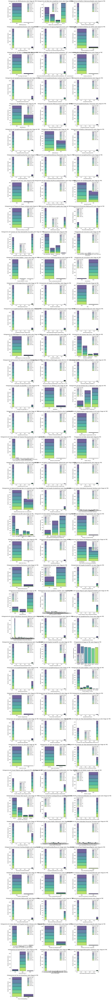

In [225]:
plot_histograms_by_stage(df,cat_var,"Stage de l'IRC")

In [226]:
df[num_final].isna().sum()

,0
Ca^2+ (meq/L),91
Age,8
Créatinine (mg/L),0
Hb (g/dL),50
Poul (bpm),69
Cl^- (meq/L),49
Na^+ (meq/L),35
TA (mmHg)/Systole,61
TA (mmHg)/Diastole,61
Urée (g/L),23


In [228]:
temp=df.copy()

In [227]:
df.shape

(306, 125)

In [230]:
df=df[df['Urée (g/L)']<=5]
df=df[df['Créatinine (mg/L)']!=0.245]
df= df[(df['TA (mmHg)/Systole']>70)]
df=df[df['Na^+ (meq/L)']!=60]
df=df[df['TA (mmHg)/Diastole'] !=8]

df=df[df['Hb (g/dL)']<18]

In [232]:
df=df[(df['Poul (bpm)']>40)]

In [255]:
df[num_final].isna().sum()/df.shape[0]

,0
Ca^2+ (meq/L),0.277778
Age,0.020833
Créatinine (mg/L),0.000000
Hb (g/dL),0.000000
Poul (bpm),0.000000
Cl^- (meq/L),0.131944
Na^+ (meq/L),0.083333
TA (mmHg)/Systole,0.000000
TA (mmHg)/Diastole,0.000000
Urée (g/L),0.000000


In [234]:
df.shape

(146, 125)

In [241]:
temp['Hb (g/dL)'][temp['Hb (g/dL)']>18]

,Hb (g/dL)
93,111.00
183,85.00
268,92.26
278,118.00


In [243]:
relation_num_categ(df[num_final+["Stage de l'IRC"]], target_col="Stage de l'IRC", use_nonparametric=True)

,Variable,Test utilisé,Statistique,p-value,Association significative
2,Créatinine (mg/L),Kruskal-Wallis,127.555054,7.857978e-26,Oui
9,Urée (g/L),Kruskal-Wallis,111.033760,2.477462e-22,Oui
3,Hb (g/dL),Kruskal-Wallis,67.741123,3.022644e-13,Oui
6,Na^+ (meq/L),Kruskal-Wallis,36.234214,8.526596e-07,Oui
0,Ca^2+ (meq/L),Kruskal-Wallis,32.731310,4.255173e-06,Oui
4,Poul (bpm),Kruskal-Wallis,26.624274,6.750106e-05,Oui
1,Age,Kruskal-Wallis,25.668195,1.034771e-04,Oui
7,TA (mmHg)/Systole,Kruskal-Wallis,21.701274,5.966698e-04,Oui
5,Cl^- (meq/L),Kruskal-Wallis,17.890541,3.086762e-03,Oui
8,TA (mmHg)/Diastole,Kruskal-Wallis,7.369884,1.945525e-01,Non


In [249]:
df["Ca^2+ (meq/L)"].describe()

,Ca^2+ (meq/L)
count,104.000000
mean,90.420288
std,9.863108
min,62.000000
25%,84.750000
50%,89.500000
75%,98.000000
max,112.600000


In [ ]:
df = df[df['Ca^2+ (meq/L)']!=0.98]

In [252]:
df[df['Ca^2+ (meq/L)']>100]['Ca^2+ (meq/L)']

,Ca^2+ (meq/L)
21,103.00
67,101.00
85,103.00
90,108.70
138,104.00
144,112.60
150,103.00
158,101.00
164,109.00
174,102.70


<ipython-input-27-5cf041307413>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=categorie, y=var, data=df, ax=axes[i], palette="viridis")


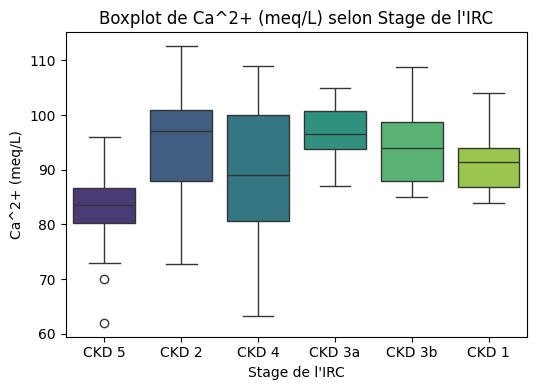

In [253]:
plot_boxplots_by_stage(df,['Ca^2+ (meq/L)'],"Stage de l'IRC")

In [254]:
df['Cl^- (meq/L)'].describe()

,Cl^- (meq/L)
count,125.000000
mean,100.482640
std,9.843235
min,28.330000
25%,99.000000
50%,102.000000
75%,105.000000
max,119.000000


In [256]:
df['Na^+ (meq/L)'].describe()

,Na^+ (meq/L)
count,132.000000
mean,137.371212
std,7.309489
min,112.000000
25%,135.000000
50%,139.000000
75%,142.000000
max,148.000000


In [257]:
temp=df.copy()

In [258]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer


# Initialiser le LabelEncoder
encoder = LabelEncoder()

# Sélectionner les colonnes catégorielles
cat_columns = df.select_dtypes(include=['object']).columns

# Appliquer LabelEncoder sur les colonnes catégorielles
for col in cat_columns:
    df[col] = encoder.fit_transform(df[col].astype(str))  # convertir en string pour éviter les erreurs

# Afficher le DataFrame après l'encodage
print("DataFrame après Label Encoding :")
print(df)

# Initialiser le KNNImputer
knn_imputer = KNNImputer(n_neighbors=3)

# Appliquer KNNImputer pour imputer les valeurs manquantes
df_imputed = pd.DataFrame(knn_imputer.fit_transform(df), columns=df.columns)

# Afficher le DataFrame après imputation
print("\nDataFrame après KNN Imputation :")
print(df_imputed)


DataFrame après Label Encoding :
      Age  Motif(s) d'Admission/Asthénie  \
0    50.0                              1   
1    28.0                              1   
3    68.0                              1   
5    58.0                              0   
8    42.0                              1   
..    ...                            ...   
297  49.0                              0   
299  47.0                              0   
300  31.0                              0   
301  64.0                              0   
304  65.0                              0   

     Motif(s) d'Admission/Altération de la fonction rénale  \
0                                                    0       
1                                                    1       
3                                                    0       
5                                                    1       
8                                                    0       
..                                                 ...       
297 

In [259]:
df.shape==df_imputed.shape

True

In [260]:
df_imputed.isna().sum()

,0
Age,0
Motif(s) d'Admission/Asthénie,0
Motif(s) d'Admission/Altération de la fonction rénale,0
Motif(s) d'Admission/HTA,0
Motif(s) d'Admission/Œdème,0
...,...
Rythme Cardiaque/Sinusal,0
Trouble de la Repolarisation,0
Stage de l'IRC,0
Causes Majeure après Diagnostic/HTA,0


In [261]:
df_imputed.to_csv('final_clean_2.csv', index=False)

In [262]:
df_imputed["Stage de l'IRC"].value_counts()

,count
Stage de l'IRC,
5.0,43
4.0,24
1.0,20
2.0,20
3.0,19
0.0,18


In [274]:
df.shape[0]*0.3

43.199999999999996

In [263]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import pandas as pd


# Séparation des variables indépendantes et de la cible
X = df_imputed.drop(target_var, axis=1)  # Variables indépendantes
y = df_imputed[target_var]  # Cible

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Appliquer SMOTE
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

# Afficher les résultats
print(f"Original size of X_train: {X_train.shape}")
print(f"Resampled size of X_res: {X_res.shape}")


Original size of X_train: (100, 124)
Resampled size of X_res: (180, 124)


In [265]:
X_res['Age'].describe()

,Age
count,100.000000
mean,52.826667
std,14.440441
min,18.000000
25%,40.000000
50%,55.000000
75%,64.000000
max,84.000000


In [269]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression,RandomF
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import pandas as pd

# Exemple de DataFrame (remplacer par vos données)
# df = pd.read_csv('votre_fichier.csv')
# X = df.drop('target', axis=1)  # caractéristiques
# y = df['target']  # variable cible

# Divisez les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=42)

# Conserver les noms des colonnes avant la standardisation
X_train_columns = X_train.columns
X_test_columns = X_test.columns

# Standardisation des données
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Instancier le modèle de régression logistique
model = LogisticRegression(max_iter=1500)

# Instancier RFE avec le modèle et le nombre de caractéristiques à sélectionner (par exemple, 10)
rfe = RFE(model, n_features_to_select=10)

# Ajuster RFE sur les données d'entraînement
rfe.fit(X_train, y_train)

# Afficher les caractéristiques sélectionnées
selected_features = X_train_columns[rfe.support_]
print("Caractéristiques sélectionnées :")
print(selected_features)

# Utiliser le modèle avec les caractéristiques sélectionnées
X_train_selected = X_train[:, rfe.support_]
X_test_selected = X_test[:, rfe.support_]

# Ajuster le modèle sur les caractéristiques sélectionnées
model.fit(X_train_selected, y_train)

# Prédictions
predictions = model.predict(X_test_selected)

# Évaluer les performances du modèle
print("Précision du modèle : ", accuracy_score(y_test, predictions))


Caractéristiques sélectionnées :
Index(['Age',
       'Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)',
       'Enquête Sociale/Phytothérapie traditionnelle', 'Symptômes/Diarrhée',
       'Evolution de l'Etat Générale/Favorable', 'Poul (bpm)',
       'Fosse Lombaire/Douloureux', 'Urée (g/L)', 'Na^+ (meq/L)',
       'Rythme Cardiaque/Sinusal'],
      dtype='object')
Précision du modèle :  0.5740740740740741


In [271]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression  # Pour servir d'estimateur dans RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score

# Exemple de DataFrame (remplacer par vos données)
# df = pd.read_csv('votre_fichier.csv')
# X = df.drop('target', axis=1)  # variables explicatives
# y = df['target']  # variable cible

# Ici, nous supposons que X et y existent ; à adapter selon vos données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Création du pipeline : standardisation -> RFE -> classifieur
pipe = Pipeline([
    ('scaler', StandardScaler()),
    # On utilise ici un estimateur à base de régression logistique pour RFE.
    # Cet estimateur sert uniquement à sélectionner les variables et n'intervient pas dans le modèle final.
    ('rfe', RFE(estimator=LogisticRegression(max_iter=1500), n_features_to_select=10)),
    ('clf', DecisionTreeClassifier())  # Valeur par défaut, remplacée via la grille
])

# Définition de la grille de paramètres pour explorer plusieurs modèles et hyperparamètres
param_grid = [
    {
        # Modèle : Arbre de décision
        'clf': [DecisionTreeClassifier(random_state=42)],
        'clf__max_depth': [None, 5, 10],
        'rfe__n_features_to_select': [5, 10, 15]
    },
    {
        # Modèle : AdaBoost avec comme modèle de base un arbre de décision (par défaut)
        'clf': [AdaBoostClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__learning_rate': [0.5, 1.0],
        'rfe__n_features_to_select': list(range(10,100,5))
    }
]

# Configuration de GridSearchCV avec 5-fold cross-validation
grid = GridSearchCV(pipe, param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Lancement de la recherche sur les données d'entraînement
grid.fit(X_train, y_train)

# Meilleur score et les meilleurs paramètres trouvés
print("Meilleur score cross-validé :", grid.best_score_)
print("Meilleurs paramètres :", grid.best_params_)

# Récupérer et afficher les caractéristiques sélectionnées :
# Pour ce faire, on applique le pipeline jusqu'à l'étape RFE sur X_train
# La méthode transform de RFE renvoie uniquement les colonnes sélectionnées
rfe_step = grid.best_estimator_.named_steps['rfe']
# On refait la standardisation pour être cohérent avec le pipeline
scaler = grid.best_estimator_.named_steps['scaler']
X_train_scaled = scaler.transform(X_train)
# Indices des colonnes sélectionnées
selected_indices = rfe_step.get_support(indices=True)
# Les noms de colonnes correspondants :
selected_features = X_train.columns[selected_indices]
print("Caractéristiques sélectionnées par RFE :", selected_features)

# Évaluation sur le jeu de test
# Prédiction via le pipeline complet
y_pred = grid.predict(X_test)
print("Précision sur le jeu de test :", accuracy_score(y_test, y_pred))


Meilleur score cross-validé : 0.7300000000000001
Meilleurs paramètres : {'clf': AdaBoostClassifier(random_state=42), 'clf__learning_rate': 0.5, 'clf__n_estimators': 50, 'rfe__n_features_to_select': 70}
Caractéristiques sélectionnées par RFE : Index(['Age', 'Motif(s) d'Admission/Altération de la fonction rénale',
       'Motif(s) d'Admission/Œdème', 'Motif(s) d'Admission/Diabète',
       'Autres Motifs d'Admission', 'Personnels Médicaux/HTA',
       'Personnels Médicaux/Diabète 2',
       'Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)',
       'Personnels Médicaux/Ulcère', 'Autres Antécédents Personnels Médicaux',
       'Durée Diabète 2 (mois)', 'Personnels Chirurgicaux/Césarienne',
       'Personnels Chirurgicaux/Hystérectomie',
       'Autre Antécédent Personnel Chirurgical', 'Personnels Familiaux/HTA',
       'Enquête Sociale/Tabac', 'Enquête Sociale/AlNS (+)',
       'Enquête Sociale/Alcool',
       'Enquête Sociale/Phytothérapie traditionnelle',
  

In [272]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE

# Importation des classifieurs
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score

# Exemple de DataFrame (remplacer par vos données)
# df = pd.read_csv('votre_fichier.csv')
# X = df.drop('target', axis=1)  # variables explicatives
# y = df['target']  # variable cible

# Ici, nous supposons que X et y existent ; à adapter selon vos données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Création du pipeline : standardisation -> RFE -> classifieur
pipe = Pipeline([
    ('scaler', StandardScaler()),
    # Le modèle de régression logistique sert ici uniquement à la sélection de variables par RFE.
    ('rfe', RFE(estimator=LogisticRegression(max_iter=1500), n_features_to_select=10)),
    ('clf', DecisionTreeClassifier())  # Classifieur par défaut, remplacé via GridSearchCV
])

# Définition de la grille de paramètres couvrant plusieurs modèles de classification
param_grid = [
    {
        # Arbre de décision
        'clf': [DecisionTreeClassifier(random_state=42)],
        'clf__max_depth': [None, 5, 10],
        'clf__min_samples_split': [2, 5],
        'rfe__n_features_to_select': list(range(5,100,5))
    },
    {
        # AdaBoost
        'clf': [AdaBoostClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__learning_rate': [0.5, 1.0],
        'rfe__n_features_to_select': list(range(5,100,5))
    },
    {
        # Forêt aléatoire
        'clf': [RandomForestClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__max_depth': [None, 5, 10],
        'rfe__n_features_to_select': list(range(5,100,5))
    },
    {
        # Gradient Boosting
        'clf': [GradientBoostingClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__learning_rate': [0.05, 0.1],
        'clf__max_depth': [3, 5],
        'rfe__n_features_to_select': list(range(5,100,5))
    },
    {
        # ExtraTrees
        'clf': [ExtraTreesClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__max_depth': [None, 5, 10],
        'rfe__n_features_to_select': list(range(5,100,5))
    },
    {
        # SVC (Support Vector Classification)
        'clf': [SVC(random_state=42)],
        'clf__kernel': ['linear', 'rbf'],
        'clf__C': [0.1, 1, 10],
        'clf__gamma': ['scale', 'auto'],
        'rfe__n_features_to_select':list(range(5,100,5))
    },
    {
        # K-Nearest Neighbors
        'clf': [KNeighborsClassifier()],
        'clf__n_neighbors': [3, 5, 7],
        'clf__weights': ['uniform', 'distance'],
        'rfe__n_features_to_select':list(range(5,100,5))
    },
    {
        # Régression logistique utilisée comme classifieur
        'clf': [LogisticRegression(max_iter=1500, solver='lbfgs', multi_class='auto')],
        'clf__C': [0.1, 1, 10],
        'rfe__n_features_to_select': list(range(5,100,5))
    }
]

# Configuration de GridSearchCV avec validation croisée à 5 plis
grid = GridSearchCV(pipe, param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Lancement de la recherche sur les données d'entraînement
grid.fit(X_train, y_train)

# Affichage du meilleur score et des meilleurs paramètres trouvés
print("Meilleur score cross-validé :", grid.best_score_)
print("Meilleurs paramètres :", grid.best_params_)

# Extraction des caractéristiques sélectionnées par RFE dans le pipeline optimal
rfe_step = grid.best_estimator_.named_steps['rfe']
scaler = grid.best_estimator_.named_steps['scaler']
# Re-transformer X_train pour récupérer les indices des variables sélectionnées
X_train_scaled = scaler.transform(X_train)
selected_indices = rfe_step.get_support(indices=True)
selected_features = X_train.columns[selected_indices]
print("Caractéristiques sélectionnées par RFE :", selected_features)

# Évaluation sur le jeu de test avec le meilleur pipeline trouvé
y_pred = grid.predict(X_test)
print("Précision sur le jeu de test :", accuracy_score(y_test, y_pred))


Meilleur score cross-validé : 0.7300000000000001
Meilleurs paramètres : {'clf': AdaBoostClassifier(random_state=42), 'clf__learning_rate': 0.5, 'clf__n_estimators': 50, 'rfe__n_features_to_select': 70}
Caractéristiques sélectionnées par RFE : Index(['Age', 'Motif(s) d'Admission/Altération de la fonction rénale',
       'Motif(s) d'Admission/Œdème', 'Motif(s) d'Admission/Diabète',
       'Autres Motifs d'Admission', 'Personnels Médicaux/HTA',
       'Personnels Médicaux/Diabète 2',
       'Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)',
       'Personnels Médicaux/Ulcère', 'Autres Antécédents Personnels Médicaux',
       'Durée Diabète 2 (mois)', 'Personnels Chirurgicaux/Césarienne',
       'Personnels Chirurgicaux/Hystérectomie',
       'Autre Antécédent Personnel Chirurgical', 'Personnels Familiaux/HTA',
       'Enquête Sociale/Tabac', 'Enquête Sociale/AlNS (+)',
       'Enquête Sociale/Alcool',
       'Enquête Sociale/Phytothérapie traditionnelle',
  

In [273]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE

# Importation des classifieurs
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score

# Exemple de DataFrame (remplacer par vos données)
# df = pd.read_csv('votre_fichier.csv')
# X = df.drop('target', axis=1)  # variables explicatives
# y = df['target']  # variable cible

# Ici, nous supposons que X et y existent ; à adapter selon vos données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Création du pipeline : standardisation -> RFE -> classifieur
pipe = Pipeline([
    ('scaler', StandardScaler()),
    # Le modèle de régression logistique sert ici uniquement à la sélection de variables par RFE.
    ('rfe', RFE(estimator=LogisticRegression(max_iter=1500), n_features_to_select=10)),
    ('clf', DecisionTreeClassifier())  # Classifieur par défaut, remplacé via GridSearchCV
])

# Définition de la grille de paramètres couvrant plusieurs modèles de classification
param_grid = [
    {
        # Arbre de décision
        'clf': [DecisionTreeClassifier(random_state=42)],
        'clf__max_depth': [None, 5, 10],
        'clf__min_samples_split': [2, 5],
        'rfe__n_features_to_select': list(range(5,50,5))
    },
    {
        # AdaBoost
        'clf': [AdaBoostClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__learning_rate': [0.5, 1.0],
        'rfe__n_features_to_select': list(range(5,50,5))
    },
    {
        # Forêt aléatoire
        'clf': [RandomForestClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__max_depth': [None, 5, 10],
        'rfe__n_features_to_select': list(range(5,50,5))
    },
    {
        # Gradient Boosting
        'clf': [GradientBoostingClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__learning_rate': [0.05, 0.1],
        'clf__max_depth': [3, 5],
        'rfe__n_features_to_select': list(range(5,50,5))
    },
    {
        # ExtraTrees
        'clf': [ExtraTreesClassifier(random_state=42)],
        'clf__n_estimators': [50, 100],
        'clf__max_depth': [None, 5, 10],
        'rfe__n_features_to_select': list(range(5,50,5))
    },
    {
        # SVC (Support Vector Classification)
        'clf': [SVC(random_state=42)],
        'clf__kernel': ['linear', 'rbf'],
        'clf__C': [0.1, 1, 10],
        'clf__gamma': ['scale', 'auto'],
        'rfe__n_features_to_select':list(range(5,50,5))
    },
    {
        # K-Nearest Neighbors
        'clf': [KNeighborsClassifier()],
        'clf__n_neighbors': [3, 5, 7],
        'clf__weights': ['uniform', 'distance'],
        'rfe__n_features_to_select':list(range(5,50,5))
    },
    {
        # Régression logistique utilisée comme classifieur
        'clf': [LogisticRegression(max_iter=1500, solver='lbfgs', multi_class='auto')],
        'clf__C': [0.1, 1, 10],
        'rfe__n_features_to_select': list(range(5,50,5))
    }
]

# Configuration de GridSearchCV avec validation croisée à 5 plis
grid = GridSearchCV(pipe, param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Lancement de la recherche sur les données d'entraînement
grid.fit(X_train, y_train)

# Affichage du meilleur score et des meilleurs paramètres trouvés
print("Meilleur score cross-validé :", grid.best_score_)
print("Meilleurs paramètres :", grid.best_params_)

# Extraction des caractéristiques sélectionnées par RFE dans le pipeline optimal
rfe_step = grid.best_estimator_.named_steps['rfe']
scaler = grid.best_estimator_.named_steps['scaler']
# Re-transformer X_train pour récupérer les indices des variables sélectionnées
X_train_scaled = scaler.transform(X_train)
selected_indices = rfe_step.get_support(indices=True)
selected_features = X_train.columns[selected_indices]
print("Caractéristiques sélectionnées par RFE :", selected_features)

# Évaluation sur le jeu de test avec le meilleur pipeline trouvé
y_pred = grid.predict(X_test)
print("Précision sur le jeu de test :", accuracy_score(y_test, y_pred))


Meilleur score cross-validé : 0.72
Meilleurs paramètres : {'clf': AdaBoostClassifier(random_state=42), 'clf__learning_rate': 0.5, 'clf__n_estimators': 100, 'rfe__n_features_to_select': 45}
Caractéristiques sélectionnées par RFE : Index(['Age', 'Motif(s) d'Admission/Œdème', 'Motif(s) d'Admission/Diabète',
       'Autres Motifs d'Admission', 'Personnels Médicaux/Diabète 2',
       'Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)',
       'Autres Antécédents Personnels Médicaux',
       'Personnels Chirurgicaux/Hystérectomie',
       'Autre Antécédent Personnel Chirurgical', 'Enquête Sociale/Tabac',
       'Enquête Sociale/Alcool',
       'Enquête Sociale/Phytothérapie traditionnelle',
       'Enquête Sociale/PEC non', 'Début des symptômes (mois)',
       'Symptômes/Douleur Lombaire', 'Symptômes/Dysurie', 'Symptômes/Diarrhée',
       'Symptômes/Douleur Thoracique', 'Symptômes/Anorexie',
       'Symptômes/Anémie', 'Symptômes/Douleur abdominale',
       'Sympt

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

# --- Import des méthodes de sélection de features ---
# Méthode Filter
from sklearn.feature_selection import SelectKBest, mutual_info_classif

# Méthode Wrapper
from sklearn.feature_selection import RFE

# Méthode Embedded
from sklearn.feature_selection import SelectFromModel

# --- Import de différents classifieurs ---
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Exemple fictif : à remplacer par vos données réelles
# df = pd.read_csv('votre_fichier.csv')
# X = df.drop('target', axis=1)
# y = df['target']
# Pour l'exemple, nous générons des données artificielles :
from sklearn.datasets import make_classification
X, y = make_classification(n_samples=500, n_features=20, n_informative=10,
                           n_redundant=5, n_classes=3, random_state=42)

# Séparation des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

###############################################################################
# 1. Méthode Filter : Utilisation de SelectKBest avec mutual_info_classif
###############################################################################
pipe_filter = Pipeline([
    ('scaler', StandardScaler()),
    ('fs', SelectKBest(score_func=mutual_info_classif)),  # Sélection par filtre
    ('clf', RandomForestClassifier(random_state=42))        # Par exemple, forêt aléatoire
])

param_grid_filter = {
    'fs__k': [5, 10, 15],
    'clf__n_estimators': [50, 100],
    'clf__max_depth': [None, 5, 10]
}

grid_filter = GridSearchCV(pipe_filter, param_grid_filter, cv=5, n_jobs=-1, scoring='accuracy')
grid_filter.fit(X_train, y_train)

print("=== Méthode Filter (SelectKBest) ===")
print("Meilleur score (CV) :", grid_filter.best_score_)
print("Meilleurs paramètres :", grid_filter.best_params_)

y_pred_filter = grid_filter.predict(X_test)
print("Précision sur le jeu de test :", accuracy_score(y_test, y_pred_filter))
print("\n")

###############################################################################
# 2. Méthode Wrapper : Utilisation de RFE avec LogisticRegression pour la sélection
###############################################################################
# Ici, la régression logistique est utilisée pour estimer l'importance des variables dans le RFE.
pipe_wrapper = Pipeline([
    ('scaler', StandardScaler()),
    ('fs', RFE(estimator=LogisticRegression(max_iter=1500, solver='lbfgs', multi_class='auto'))),
    ('clf', DecisionTreeClassifier(random_state=42))  # Exemple avec un arbre de décision
])

param_grid_wrapper = {
    'fs__n_features_to_select': [5, 10, 15],
    'clf__max_depth': [None, 5, 10],
    'clf__min_samples_split': [2, 5]
}

grid_wrapper = GridSearchCV(pipe_wrapper, param_grid_wrapper, cv=5, n_jobs=-1, scoring='accuracy')
grid_wrapper.fit(X_train, y_train)

print("=== Méthode Wrapper (RFE) ===")
print("Meilleur score (CV) :", grid_wrapper.best_score_)
print("Meilleurs paramètres :", grid_wrapper.best_params_)

# Extraction des indices des caractéristiques sélectionnées
rfe_step = grid_wrapper.best_estimator_.named_steps['fs']
scaler_wrapper = grid_wrapper.best_estimator_.named_steps['scaler']
X_train_scaled = scaler_wrapper.transform(X_train)
selected_indices = rfe_step.get_support(indices=True)
print("Indices des caractéristiques sélectionnées :", selected_indices)

y_pred_wrapper = grid_wrapper.predict(X_test)
print("Précision sur le jeu de test :", accuracy_score(y_test, y_pred_wrapper))
print("\n")

###############################################################################
# 3. Méthode Embedded : Utilisation de SelectFromModel avec régression logistique L1
###############################################################################
# La régression logistique avec régularisation L1 peut exclure (pondération à zéro) certaines variables.
pipe_embedded = Pipeline([
    ('scaler', StandardScaler()),
    ('fs', SelectFromModel(
            LogisticRegression(max_iter=1500, solver='liblinear', penalty='l1', multi_class='ovr')
        )),  # SelectFromModel intégré dans le modèle
    ('clf', DecisionTreeClassifier(random_state=42))  # Nous utilisons ici un arbre de décision comme modèle final
])

param_grid_embedded = {
    # Le paramètre 'threshold' dans SelectFromModel permet de contrôler la sélection ;
    # ici on peut explorer plusieurs seuils relatifs aux coefficients.
    'fs__threshold': ['mean', 'median', 0.01],
    'clf__max_depth': [None, 5, 10],
    'clf__min_samples_split': [2, 5]
}

grid_embedded = GridSearchCV(pipe_embedded, param_grid_embedded, cv=5, n_jobs=-1, scoring='accuracy')
grid_embedded.fit(X_train, y_train)

print("=== Méthode Embedded (SelectFromModel) ===")
print("Meilleur score (CV) :", grid_embedded.best_score_)
print("Meilleurs paramètres :", grid_embedded.best_params_)

# Pour afficher le nombre de caractéristiques sélectionnées par SelectFromModel,
fs_step = grid_embedded.best_estimator_.named_steps['fs']
mask = fs_step.get_support()
print("Nombre de caractéristiques sélectionnées :", mask.sum())

y_pred_embedded = grid_embedded.predict(X_test)
print("Précision sur le jeu de test :", accuracy_score(y_test, y_pred_embedded))
